In [24]:
import numpy as np 
import torch
from torchsummary import summary
import torch.optim as optim
import matplotlib.pyplot as plt
import pandas as pd
import torch; torch.manual_seed(0)
import torch.nn as nn
import torch.nn.functional as F
import torch.utils
import matplotlib.pyplot as plt; plt.rcParams['figure.dpi'] = 200
import matplotlib 

In [25]:
device = 'cpu'
gen_dir = 'generated_data/'
models_dir = 'models/'
plot_dir = 'plots/'
matplotlib.rcParams.update({'font.size': 22})

In [87]:
def get_index(train_batches,shuffle_batches=True, seed=42):
    if shuffle_batches:
        np.random.seed(seed)
        indexes = np.random.randint(0, train_batches, train_batches)
        return iter(indexes)
    else:
        return iter(range(train_batches))
def get_batch(data, index, shuffle_stocks=True, extra_dim=False):
    batch = data[index, :, :].copy()
    batch = np.transpose(batch)
    if shuffle_stocks:
        batch = batch[:, np.random.permutation(batch.shape[1])]
    if extra_dim:
        batch = np.expand_dims(batch, axis=1)
    return batch

class VAE_Base(nn.Module):
    def __init__(self, latent_dims):
        super(VAE_Base, self).__init__()
        self.latent_dims = latent_dims
        
    def reparameterize(self, mu, logvar):
        sigma = torch.exp(logvar)
        N = torch.distributions.Normal(0,1)
        # return torch.normal(mu, std)
        # esp = torch.randn(*mu.size())
        z = mu + sigma*N.sample(mu.shape)
        self.kl = (sigma**2 + mu**2 - torch.log(sigma) - 1/2).sum()
        return z
    
    def bottleneck(self, h):
        mu, logvar = self.fc1(h), self.fc2(h)
        z = self.reparameterize( mu, logvar)
        return z, mu, logvar

    def encode(self, x):
        h = self.encoder(x)
        z, mu, logvar = self.bottleneck(h)
        return z, mu, logvar

    def decode(self, z):
        z = self.decoder(z)
        return z

    def forward(self, x):
        z, mu, logvar = self.encode(x)
        z = self.decode(z)
        return z, mu, logvar 

def plot_training(losses, save=True,plot_dir = plot_dir, name=None):
    fig, axes = plt.subplots(1,len(losses), sharex=False, sharey=False, figsize=(40,20), dpi= 50)
    for i , (key, value) in enumerate(losses.items()):
        x_points = range(0, len(value))
        axes[i].set_title(key)
        axes[i].plot(x_points, value, color="blue", linewidth=5)
        axes[i].yaxis.grid(True, zorder=0)
        axes[i].set_xlabel('Iteration')
    if name:
        fig.suptitle(name + ' Training losses', fontsize=30)
          # axes[i].legend(loc='upper right')
    plt.tight_layout()
    plt.show()
    if save:
        file_name = name.replace(' ', '_')
        file_name = file_name.lower()
        fig.savefig(plot_dir+file_name+'_trainloss.png')
        plt.close(fig)

def train_vae(vae, data, epochs=20, shuffle_stocks=True,shuffle_batches=True,extra_dim=False,learning_rate=0.0001, lambda_rec=0.7, lambda_reg=0.3, name=None ):
    train_batches = data.shape[0] # N hereafter. Number of training images in database.
    opt = torch.optim.Adam(vae.parameters(), lr=learning_rate)
    loss_total_to_plot = []
    loss_recon_to_plot = []
    loss_reg_to_plot = []
    
    for epoch in range(epochs):
        vae.train()
        indexes = get_index(train_batches,shuffle_batches)
        loss_total = 0
        loss_recon_total = 0
        loss_reg_total = 0
        for i in range(train_batches):
            index = next(indexes)
            batch= get_batch(data.copy(), index, shuffle_stocks=shuffle_stocks ,extra_dim=extra_dim)
            x = torch.from_numpy(batch) # GPU
            # print(x.shape)
            opt.zero_grad()
            x_hat, mu, logvar = vae(x)
            loss_recon = ((x - x_hat)**2).sum()
            reg_loss = vae.kl
            loss = lambda_rec*loss_recon + lambda_reg*reg_loss
            # loss = 0.7*((x - x_hat)**2).sum() + 0.3*vautoencoder.encoder.kl
            loss.backward()
            opt.step()
            loss_total += loss.item()
            loss_recon_total += loss_recon.item()
            loss_reg_total += reg_loss.item()

        loss_total_to_plot.append(loss_total/train_batches)
        loss_recon_to_plot.append(loss_recon_total/train_batches)
        loss_reg_to_plot.append(loss_reg_total/train_batches)
        print('Epoch %s/%s, Loss=%s, Recon=%s, Reg=%s ' % (epoch+1, epochs, loss_total/train_batches, loss_recon_total/train_batches, loss_reg_total/train_batches))
    losses={'Total Loss': loss_total_to_plot, 
            'Reconstruction loss': loss_recon_to_plot, 
            'Regularization loss':loss_reg_to_plot}
    plot_training(losses, name=name)

    return vae


def plot_reconstruction(batch_idx, series_idx, model, data, extra_dim=False, save=True,plot_dir = plot_dir, name=None):
    batch= data[batch_idx]
    batch= np.transpose(batch)
    x = torch.from_numpy(batch)
    model.eval()
    if extra_dim:
        x = x.view( x.size(0), 1, x.size(1))
    # print(x.shape)
    x_hat, _, _, = model(x.to(device))
    # x_hat = vae.decoder(z)
    # x_hat = x_hat.numpy()
    x_hat = x_hat.to('cpu').detach().numpy()
    # print(x_hat.shape)
    if extra_dim:
        x_hat = np.squeeze(x_hat, 1)
    # print(x_hat.shape)

    fig, axes = plt.subplots(3,1, figsize=(30,20), dpi= 50)
    axes[0].plot(batch[series_idx, :], label='original', )
    axes[0].plot(x_hat[series_idx, :], label='reconstructed')
    axes[0].legend()
    axes[1].plot(x_hat[series_idx, :], label='reconstructed', color='darkorange')
    axes[1].legend()
    axes[2].plot(batch[series_idx, :], label='original')
    axes[2].legend()
    # title
    if name:
        fig.suptitle(name + ' Reconstruction', fontsize=30)
    plt.tight_layout()
    plt.show()
    if save:
        file_name = name.replace(' ', '_')
        file_name = file_name.lower()
        fig.savefig(plot_dir+file_name+'_reconstruction.png')
        plt.close(fig)
    return x_hat 

def vae_generation(decoder,latent_dims, extra_dim=False):
    # enc_dec_net: Network with encoder and decoder, pretrained.
    # n_samples: how many samples to produce.
    
    # Create samples of z from Gaussian N(0,I), where means are 0 and standard deviations are 1 in all dimensions.
    z_samples = np.random.normal(loc=0.0, scale=1.0, size=latent_dims)
    z_samples_t = torch.tensor(z_samples, dtype=torch.float64)
    # print(z_samples_t.shape)
    x_samples = decoder(z_samples_t)
    # print(x_samples.shape)
    
    x_samples_np = x_samples if type(x_samples) is np.ndarray else x_samples.detach().numpy()  # torch to numpy
    if extra_dim:
        # print('a')
        x_samples_np = np.squeeze(x_samples_np, 1)

    return x_samples_np  


class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)
    
class UnFlatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), 1, input.size(1))

class PrintLayer(nn.Module):
    def __init__(self, name=None):
        super(PrintLayer, self).__init__()
        self.name = name
    
    def forward(self, x):
        # Do your print / debug stuff here
        print(self.name)
        # print(x)
        print(x.shape)
        return x 
        
def plot_series(batch, idxs:list, label, title=None,  merge=False, save=True,plot_dir = plot_dir):
    # fig, ax = plt.subplots(1, len(idxs), figsize=figsize)
    for i, idx in enumerate(idxs):
        plt.plot(batch[idx], label=label+str(i))
        plt.legend()
        if title:
            plt.suptitle(title)
        plt.show()
    if merge:
        fig, ax = plt.subplots(1, 1, figsize=(15,5))
        for i, idx in enumerate(idxs):
            ax.plot(batch[idx], label=label+str(i))
            ax.legend()
        if title:
            fig.suptitle(title)
            plt.show()
        
        fig, axes = plt.subplots(3,1, figsize=(30,20), dpi= 50)
        axes[0].plot(batch[idxs[0]], label=label+str(1))
        axes[0].legend()
        axes[1].plot(batch[idxs[1]], label=label+str(2),  color='darkorange')
        axes[1].legend()
        axes[2].plot(batch[idxs[0]], label=label+str(1))
        axes[2].plot(batch[idxs[1]], label=label+str(2))
        axes[2].plot(batch[idxs[2]], label=label+str(3))
        axes[2].legend()
        if title:
            fig.suptitle(title)
            plt.show()
    if save:
        file_name = title.replace(' ', '_')
        file_name = file_name.lower()
        fig.savefig(plot_dir+file_name+'.png')
        plt.close(fig)

In [4]:
# Load data
data = np.load('master_data/data.npy')
train_batches = data.shape[0] # N hereafter. Number of training images in database.
length = data.shape[1] 
stocks = data.shape[2]
print('Number of training batches: ', train_batches)
print('Length of each batch: ', length)
print('Number of stocks: ', stocks)

Number of training batches:  79
Length of each batch:  256
Number of stocks:  434


## VAE Fully Dense 

    # Encoder 
    input
    torch.Size([434, 256])
    linear
    torch.Size([434, 128])

    # Latent space
    torch.Size([434, 20])
    
    # Decoder
    decoder input
    torch.Size([434, 128])
    linear
    torch.Size([434, 256])

In [84]:
class VAE_Dense(VAE_Base):
    def __init__(self, **kwargs ):
        super(VAE_Dense, self).__init__(**kwargs )
        self.encoder = nn.Sequential(
            nn.Linear(256, 128).double(),
            nn.ReLU()
        )
          
        self.fc1 = nn.Linear(128, self.latent_dims).double()
        self.fc2 = nn.Linear(128, self.latent_dims).double()
        
        self.decoder = nn.Sequential(
            nn.Linear(self.latent_dims, 128).double(),
            nn.ReLU(),
            nn.Linear(128, 256).double()
        )
        


In [85]:
latent_dims = 20
train = False
vae = VAE_Dense(latent_dims=latent_dims).to(device)
model_name = 'VAE Dense Layers 1'


In [57]:

if train:
    vae = train_vae(vae, data.copy(), 60, learning_rate=0.0001, lambda_rec=0.7, lambda_reg=0.3, name=model_name)
    # torch.save(vae.state_dict(), models_dir+'vaefd1.pth')
else:
    vae.load_state_dict(torch.load(models_dir+'vaefd1.pth'))
    vae.eval()
    print('Model loaded')


Model loaded


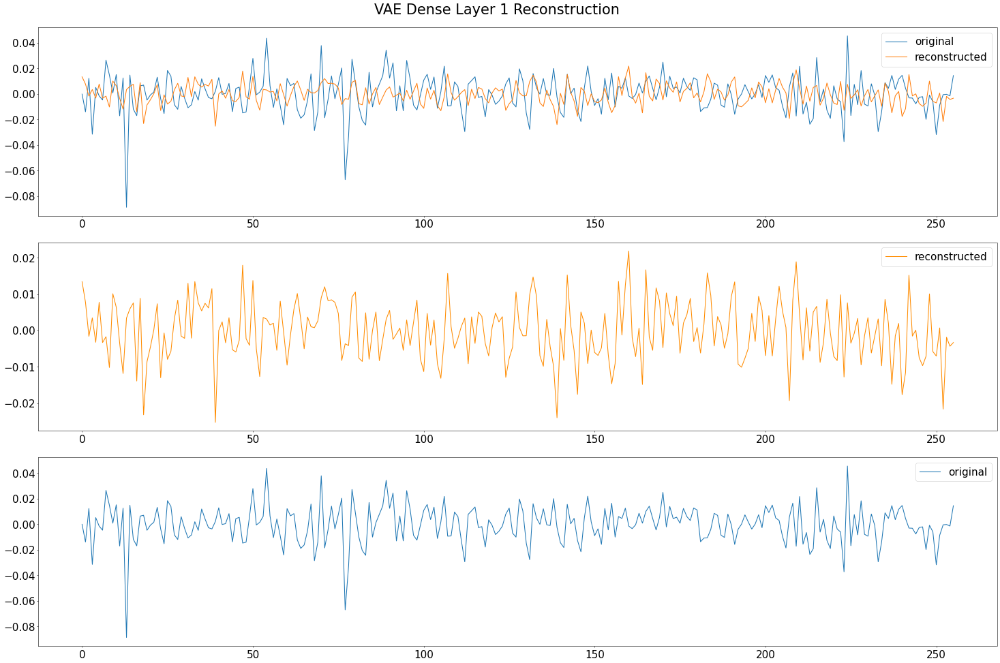

In [33]:
batch_idx = 0
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae, data, extra_dim=False, name=model_name)

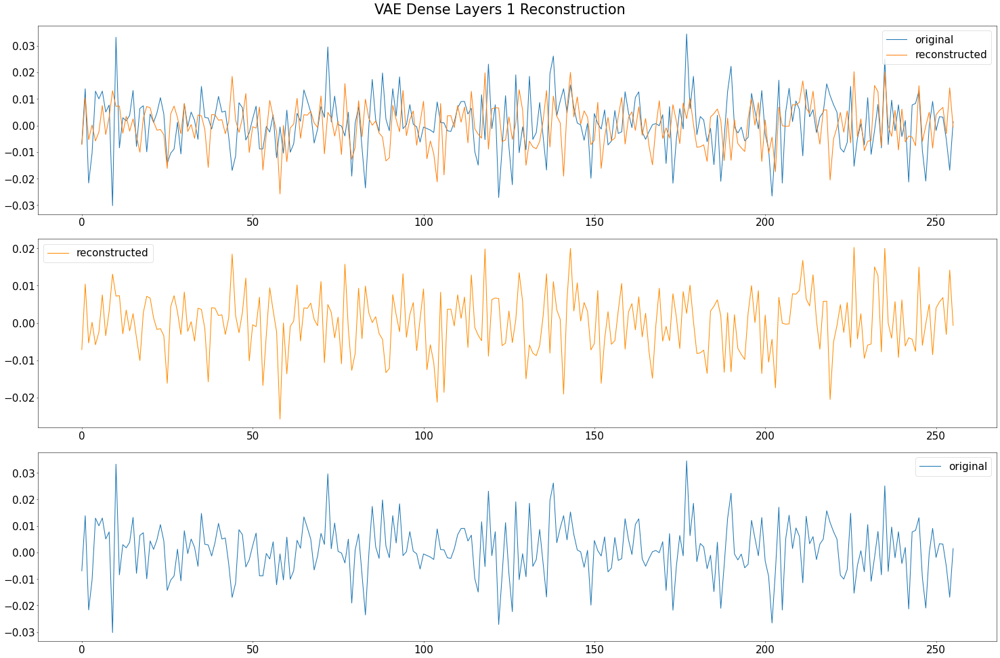

In [64]:
batch_idx = 40
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae, data, extra_dim=False,  name=model_name, save=True)

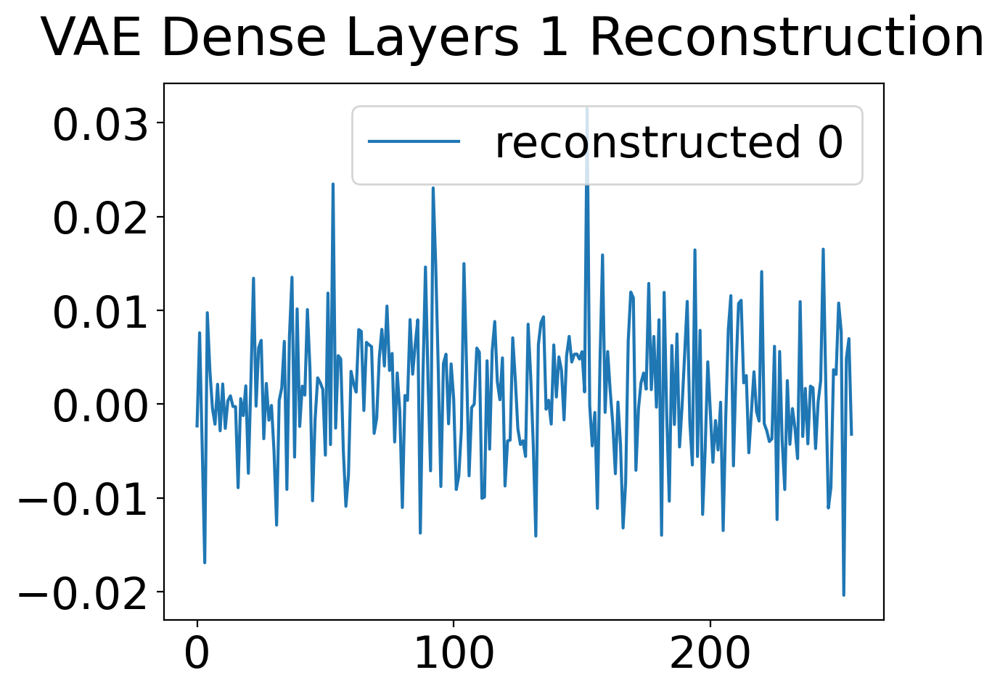

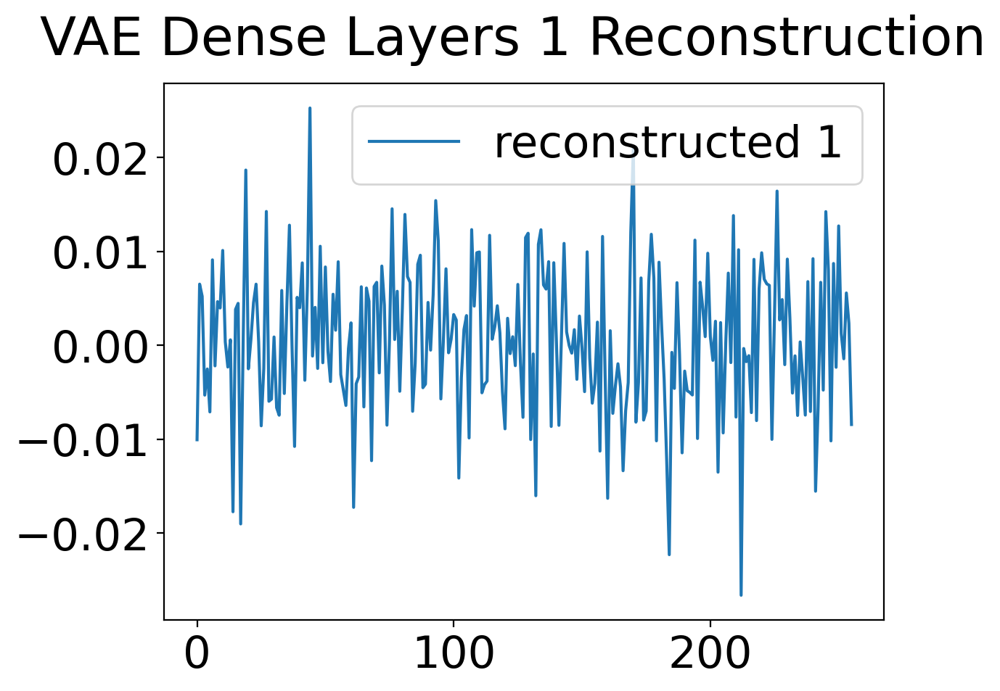

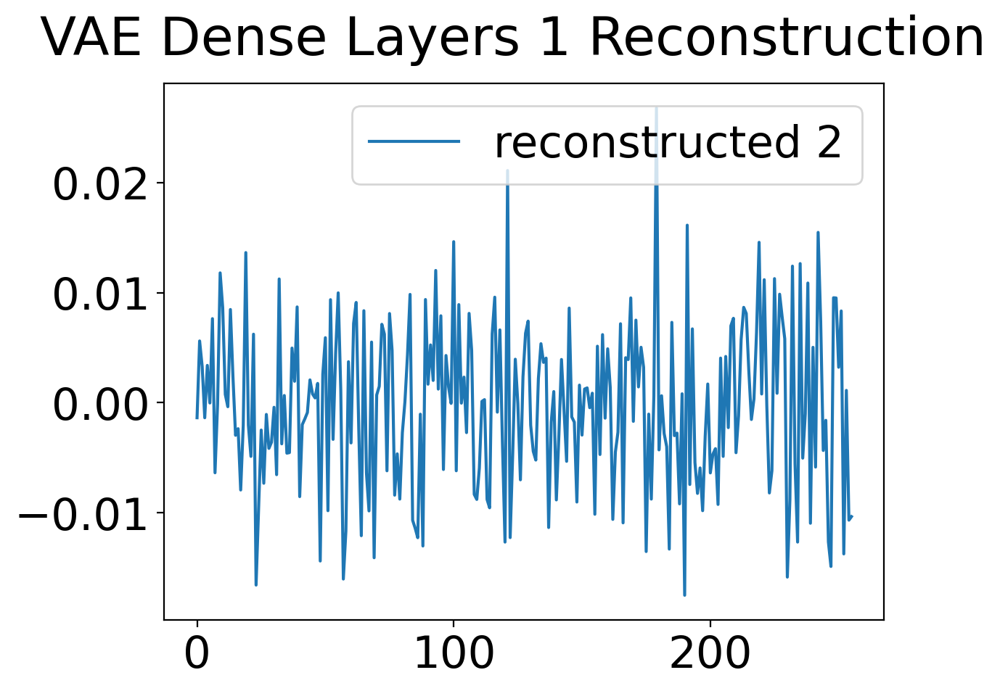

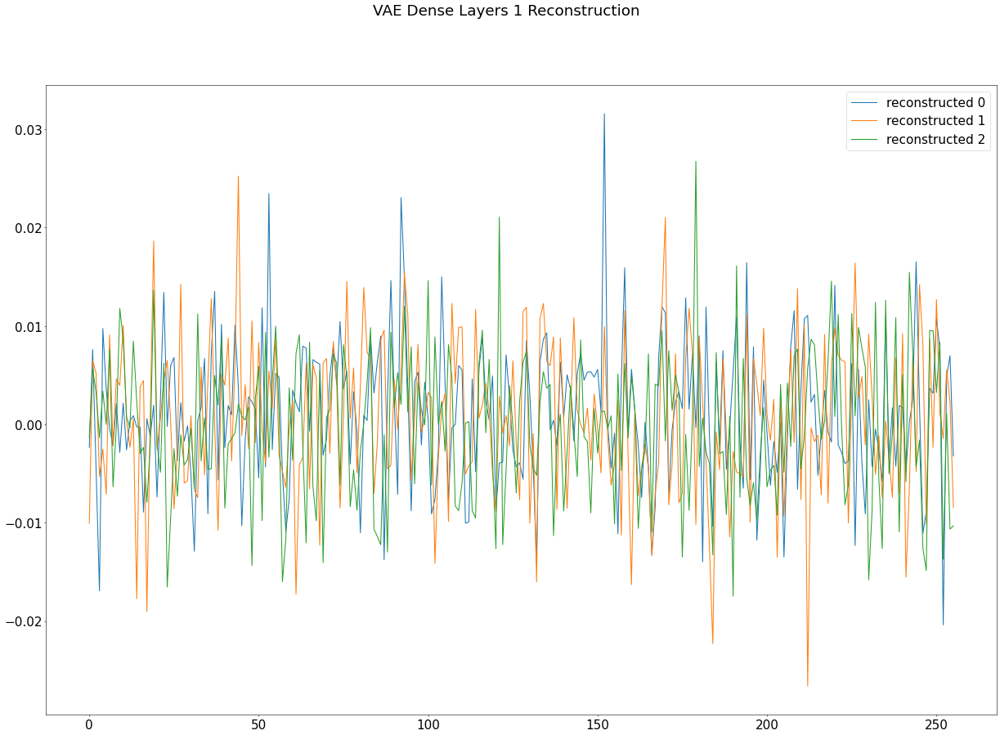

In [63]:
idxs = [20,50,110]
plot_series(x_hat, idxs, label = 'reconstructed ', title= model_name+' Reconstruction', save=False ,merge=True)


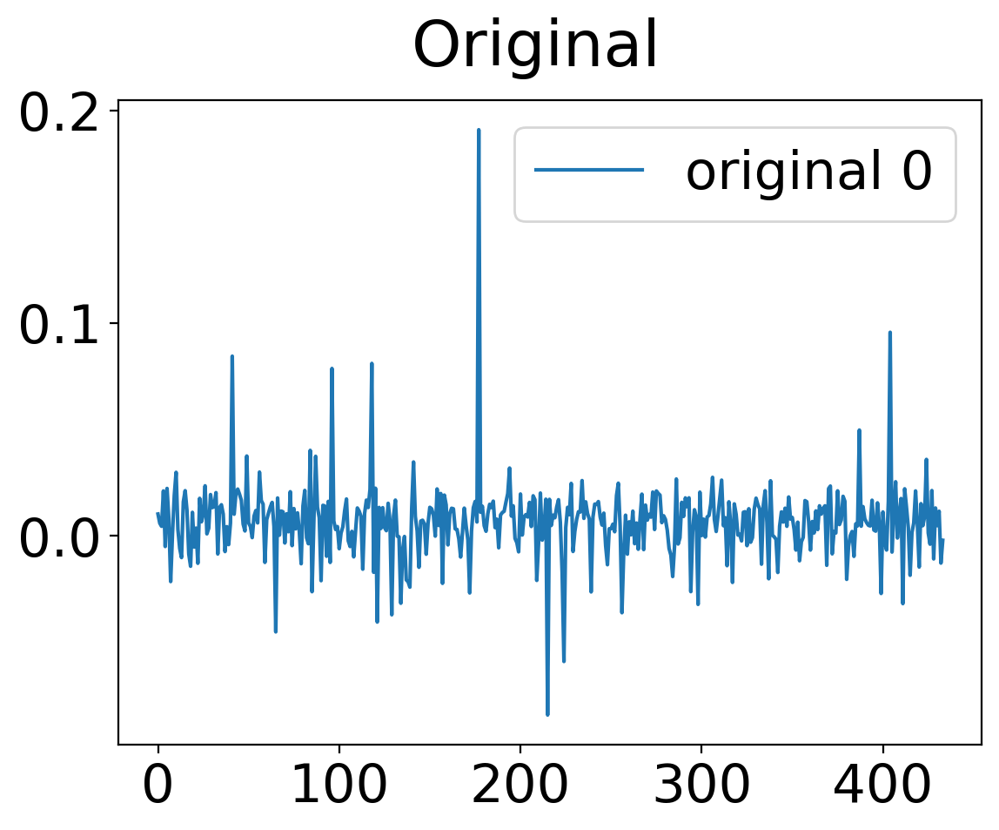

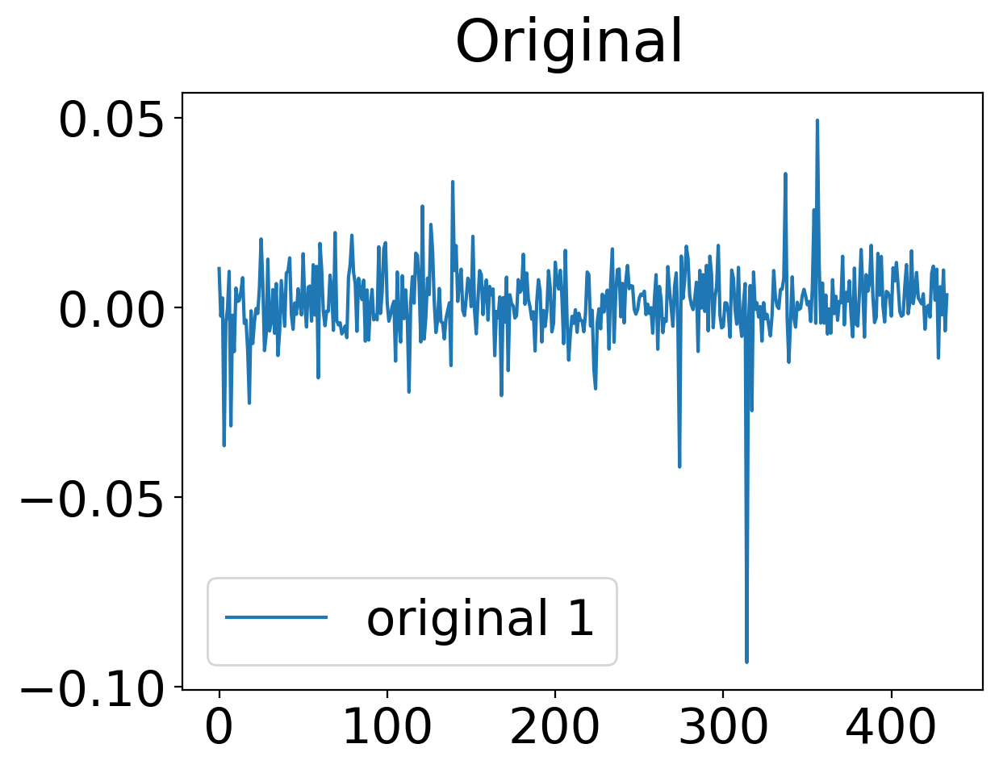

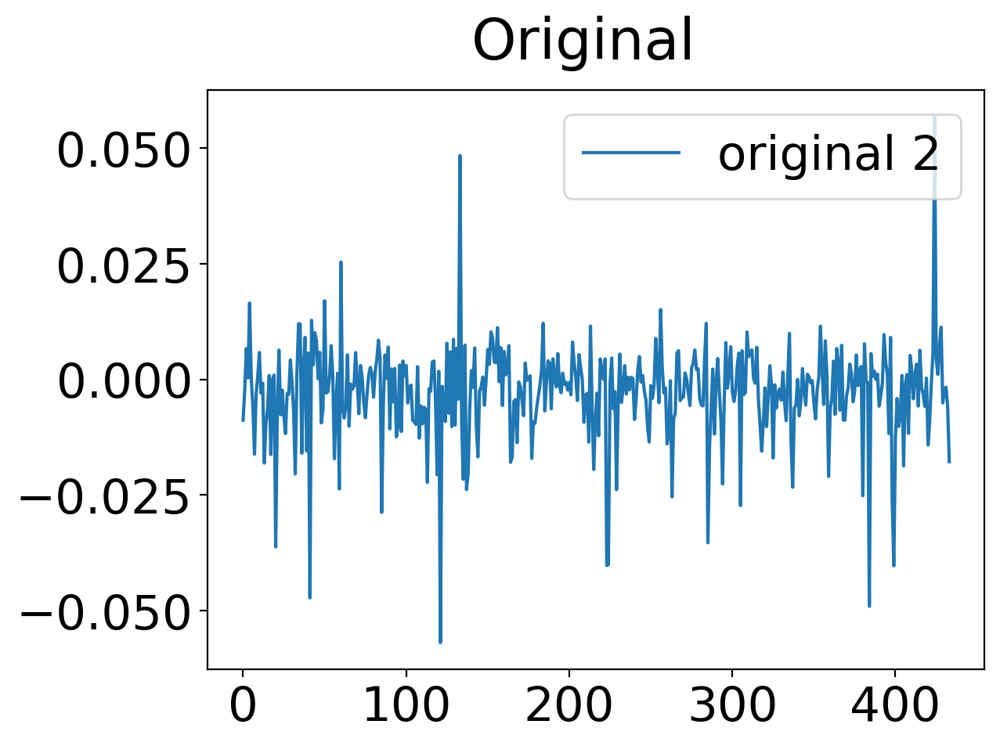

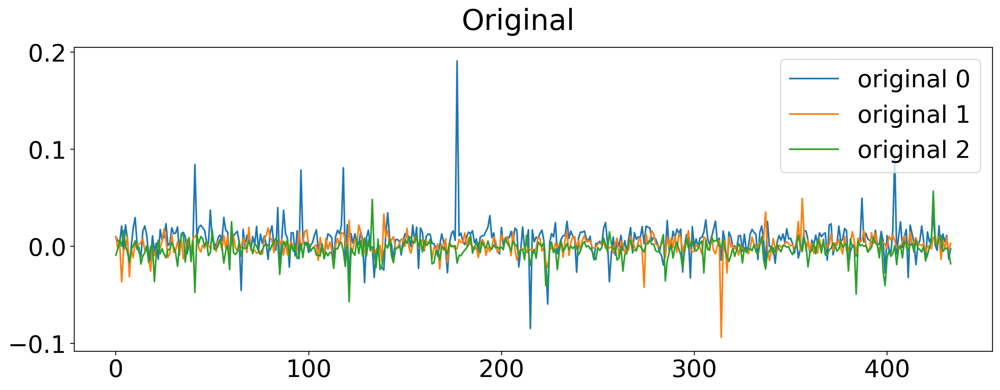

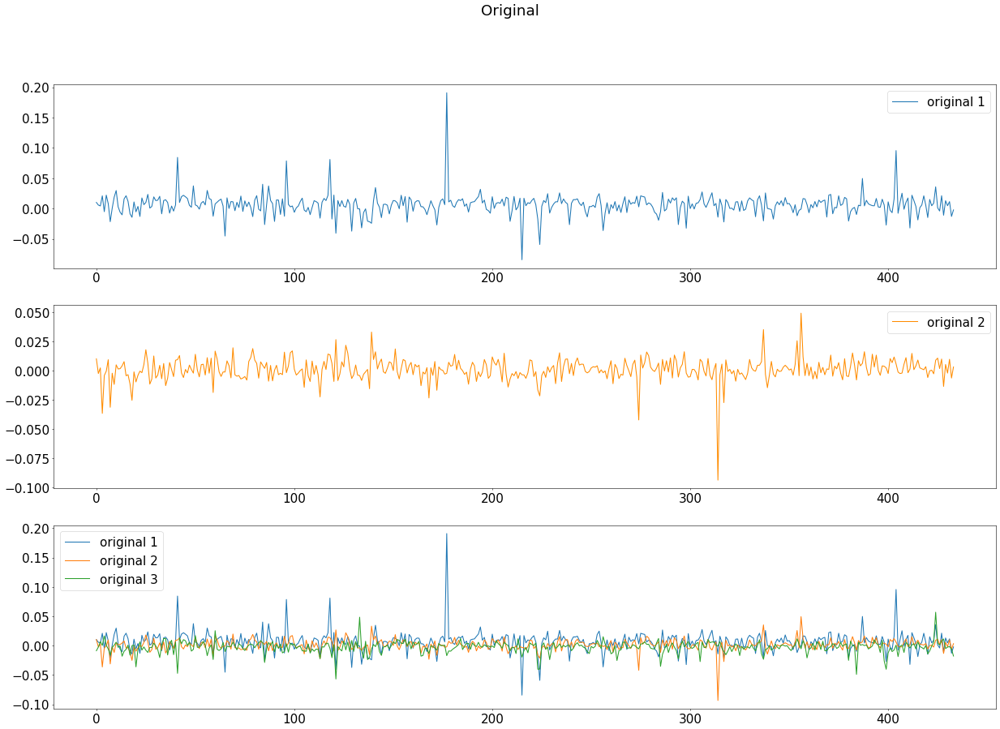

In [129]:
plot_series(data[batch_idx], idxs, label = 'original ', title='Original', save=True, merge=True)

In [66]:
# latent_dims = [stocks, 10]
latent_dims = 20
do_generation = False
if do_generation:
    generation = vae_generation(vae.decoder, latent_dims=[stocks, latent_dims])
    np.save(gen_dir+'vaefd1.npy',generation)
else:
    generation = np.load(gen_dir+'vaefd1.npy')
print(generation.shape)
# out

(434, 256)


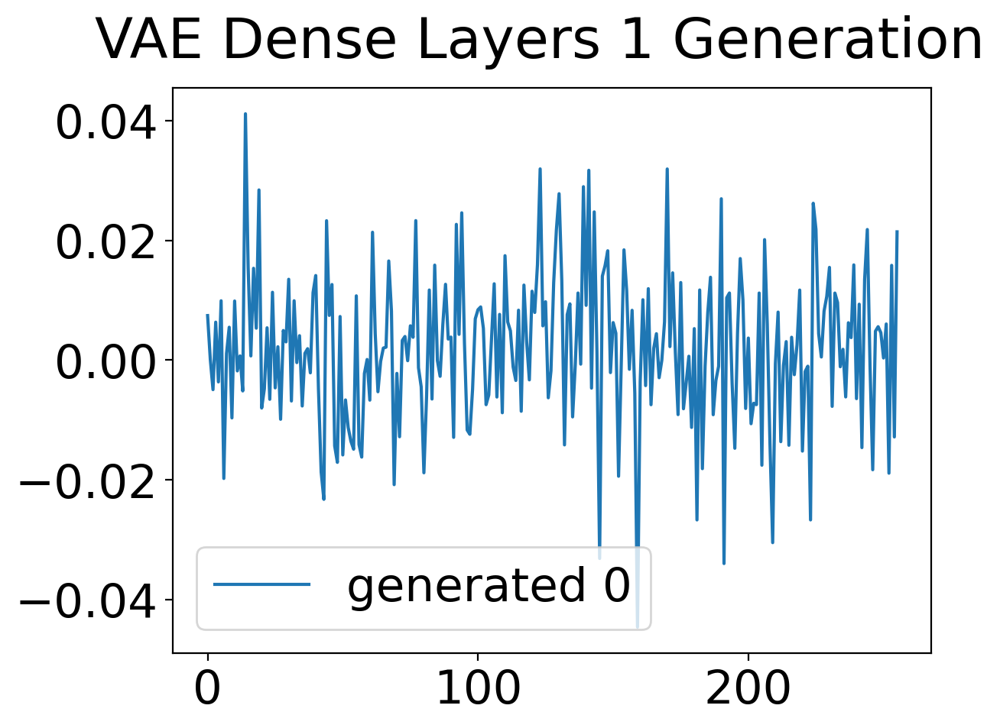

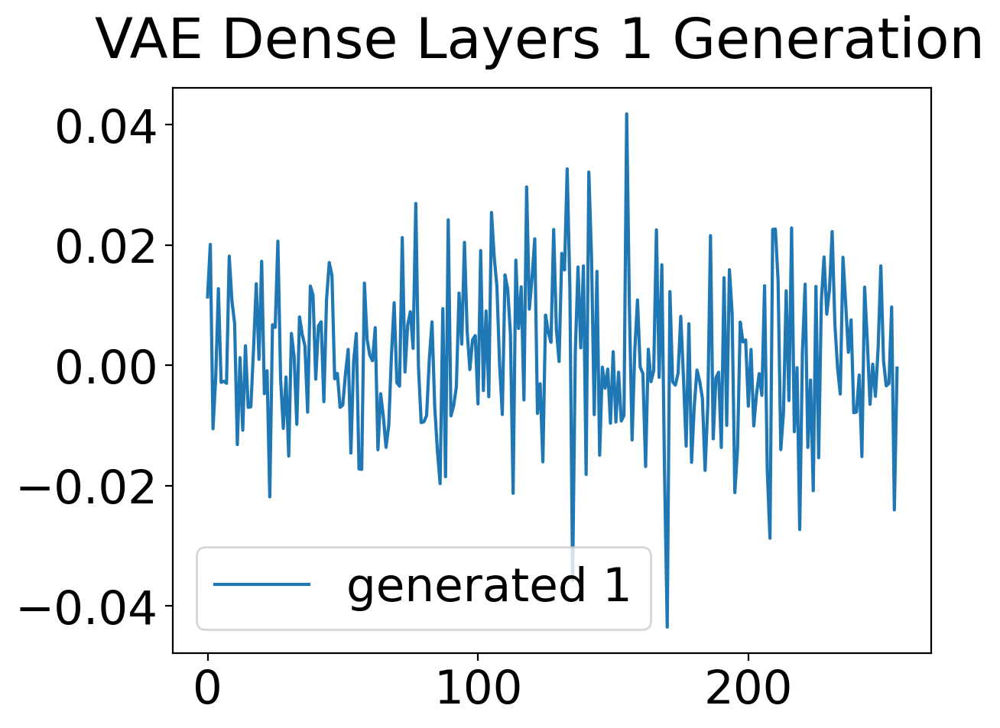

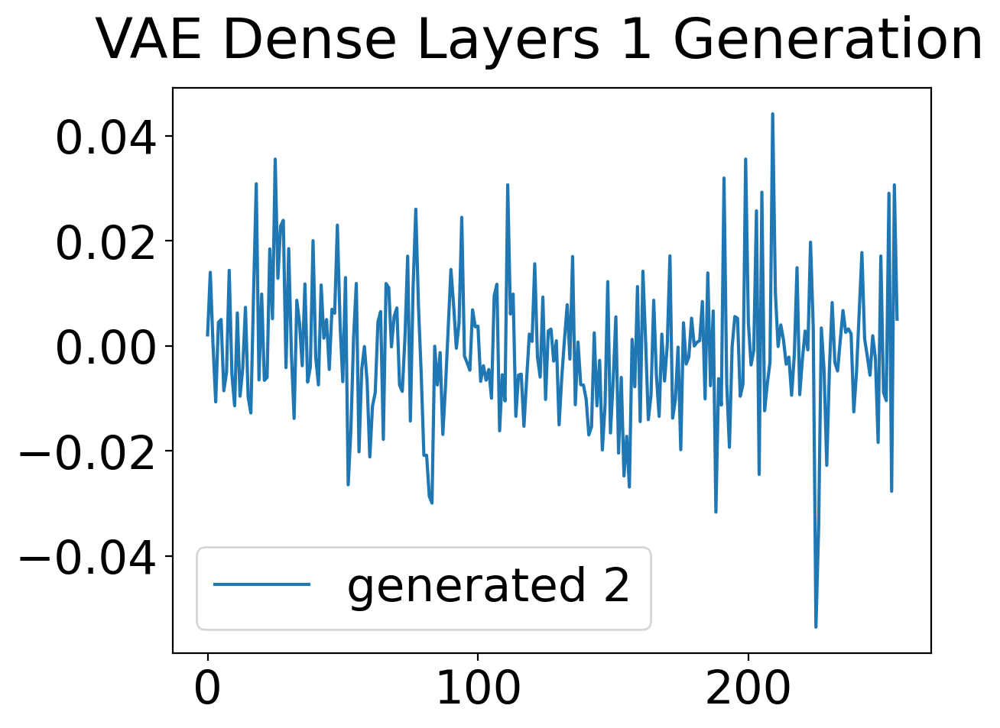

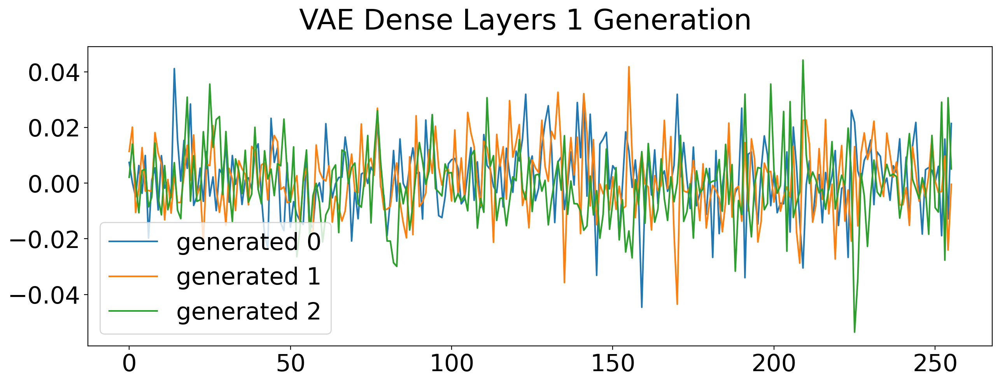

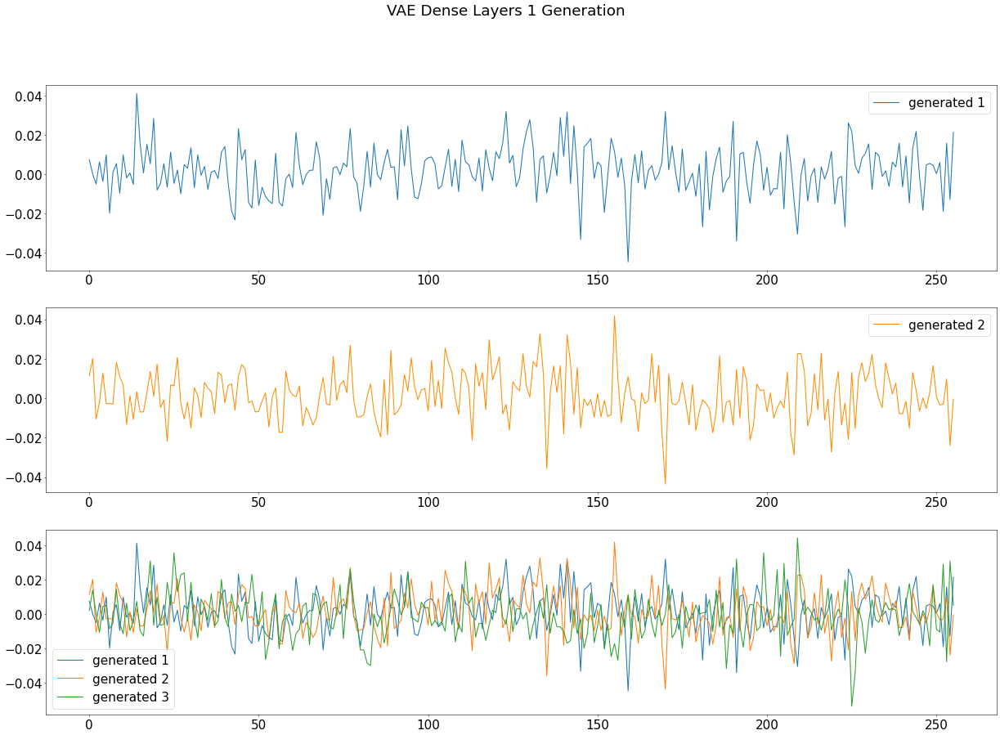

In [89]:
idx = [1, 2, 3]
plot_series(generation, idxs, label = 'generated ', title=model_name+' Generation', save=True, merge=True)


In [324]:
np.save(gen_dir+'vaefd1.npy',generation)
torch.save(vae.state_dict(), models_dir +"vaefd1.pth") 

## VAE Fully Dense paper

In [91]:
class VAE_Dense1(VAE_Base):
    def __init__(self, **kwargs ):
        super(VAE_Dense1, self).__init__(**kwargs )
        self.encoder = nn.Sequential(
            nn.Linear(256, 80).double(),
            nn.ReLU(),
            nn.Linear(80, 40).double(),
            nn.ReLU(),
            nn.Linear(40, 20).double(),
            nn.ReLU(),
        )
          
        self.fc1 = nn.Linear(20, self.latent_dims).double()
        self.fc2 = nn.Linear(20, self.latent_dims).double()
        
        self.decoder = nn.Sequential(
            nn.Linear(self.latent_dims, 20).double(),
            nn.ReLU(),
            nn.Linear(20, 40).double(),
            nn.ReLU(),
            nn.Linear(40, 80).double(),
            nn.ReLU(),
            nn.Linear(80, 256).double(),
        )

In [92]:
latent_dims = 10
train = True
vae1 = VAE_Dense1(latent_dims=latent_dims).to(device)
model_name = 'VAE Dense Layers 2'

Epoch 1/15, Loss=1211.5959514875792, Recon=273.16641582515444, Reg=2150.0254871500038 
Epoch 2/15, Loss=838.474389863703, Recon=48.798411918255255, Reg=1628.1503678091512 
Epoch 3/15, Loss=775.1302365708679, Recon=40.94037558338834, Reg=1509.3200975583477 
Epoch 4/15, Loss=771.5592725669691, Recon=38.77497795867589, Reg=1504.3435671752611 
Epoch 5/15, Loss=770.892175183716, Recon=37.539376326921065, Reg=1504.244974040511 
Epoch 6/15, Loss=770.4988810440557, Recon=36.785834887955495, Reg=1504.2119272001557 
Epoch 7/15, Loss=770.2187138357937, Recon=36.24746836492219, Reg=1504.1899593066657 
Epoch 8/15, Loss=769.9971719978809, Recon=35.823780920759425, Reg=1504.170563075002 
Epoch 9/15, Loss=769.8458951335709, Recon=35.54010077718056, Reg=1504.1516894899612 
Epoch 10/15, Loss=769.7275974326143, Recon=35.31349650310932, Reg=1504.141698362119 
Epoch 11/15, Loss=769.6351653991941, Recon=35.13296723465291, Reg=1504.1373635637356 
Epoch 12/15, Loss=769.5601954822229, Recon=34.98469321735703, 

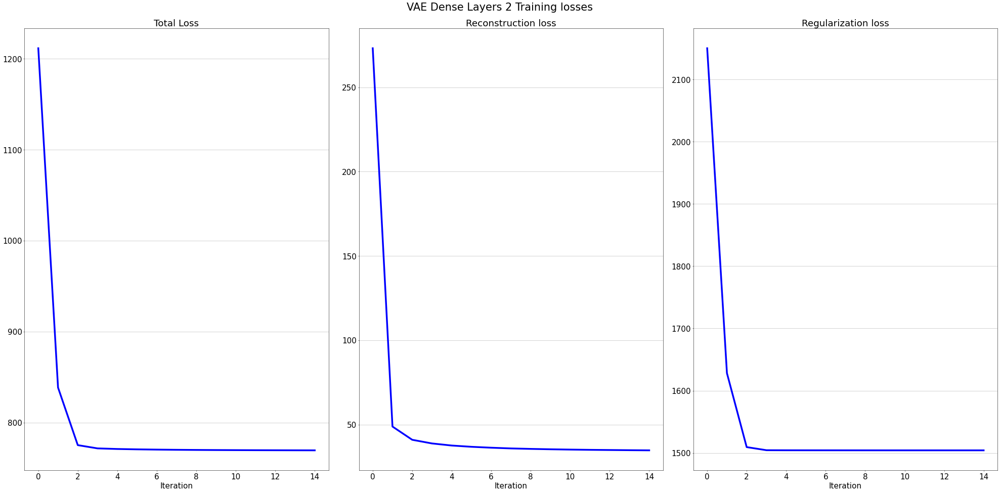

In [73]:
if train:
    vae1 = train_vae(vae1, data.copy(), 15, learning_rate=0.0004, lambda_rec=0.5, lambda_reg=0.5, name=model_name)
    # torch.save(vae1.state_dict(), models_dir+'vaefd2.pth')
else:
    vae1.load_state_dict(torch.load(models_dir+'vaefd2.pth'))
    vae1.eval()
    print('Model loaded')

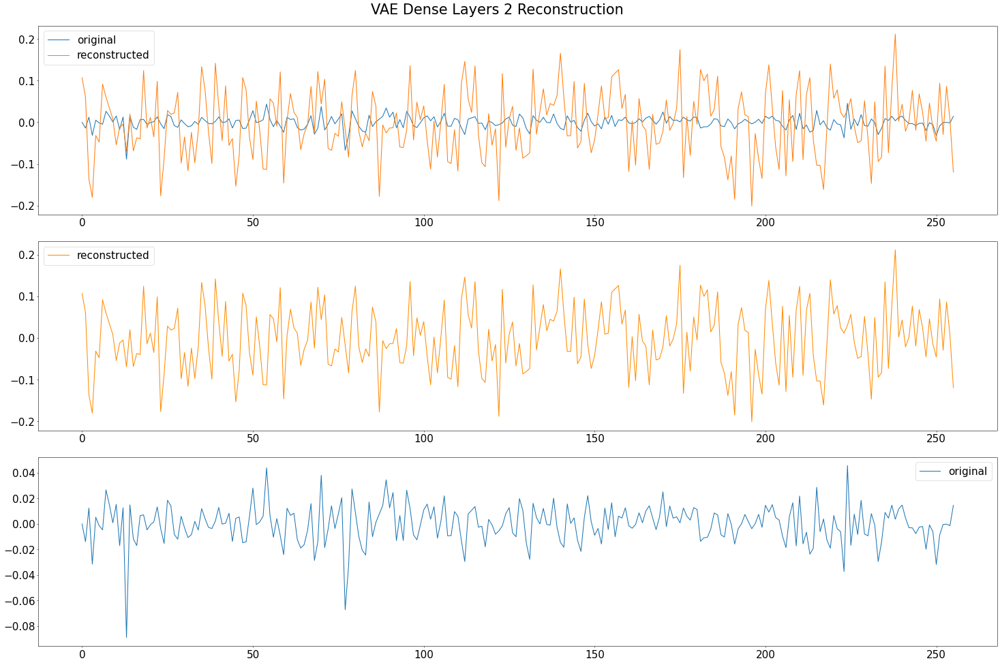

In [95]:
batch_idx = 0
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae1, data.copy(), extra_dim=False, name=model_name)

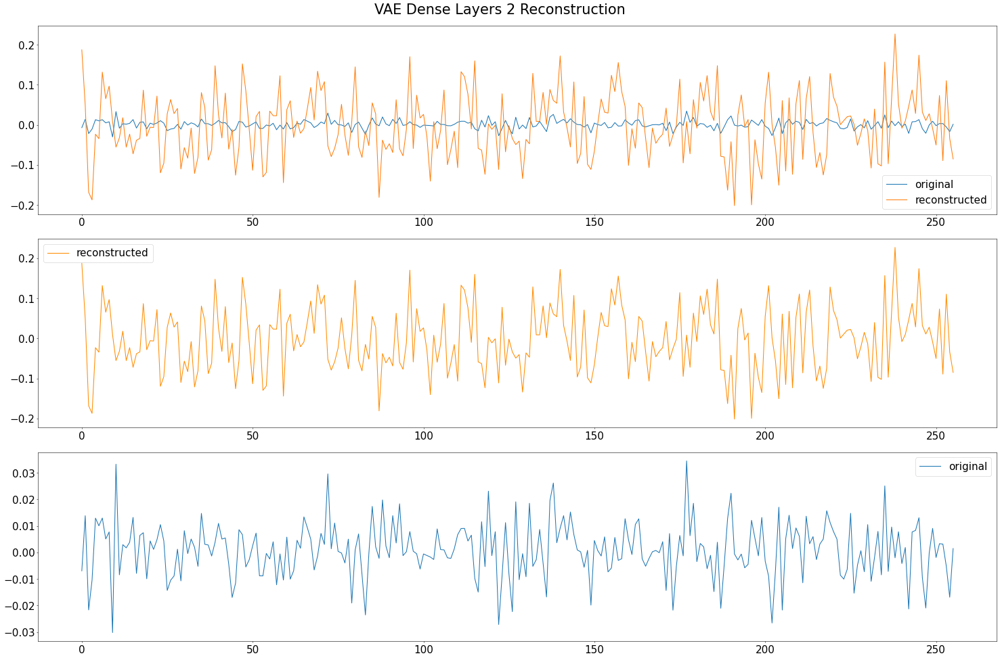

In [96]:
batch_idx = 40
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae1, data.copy(), extra_dim=False, name=model_name)

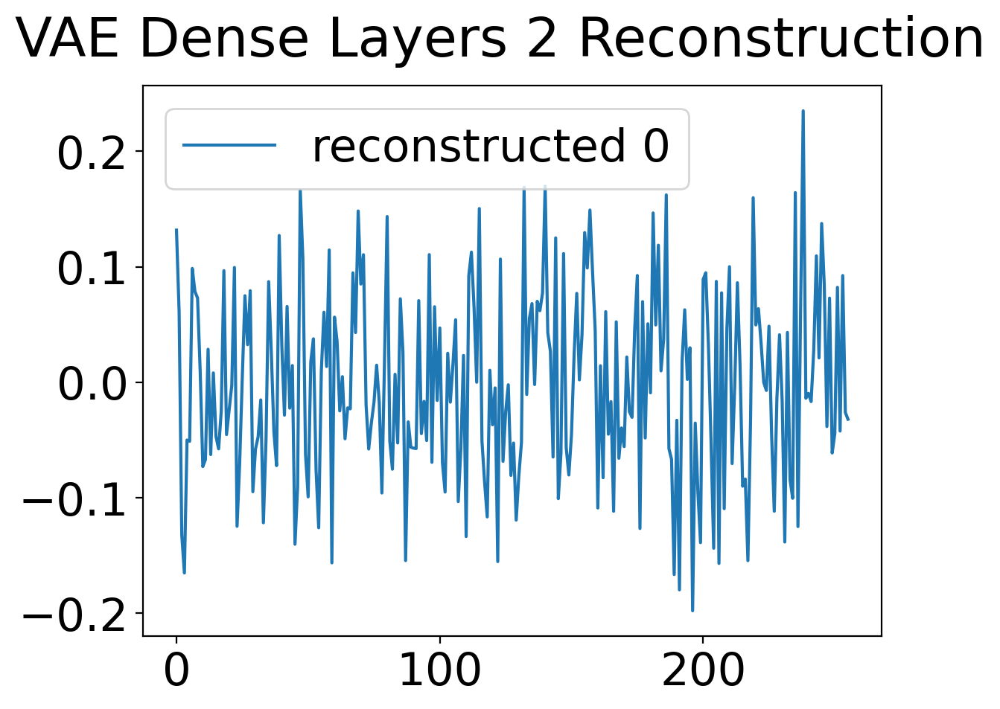

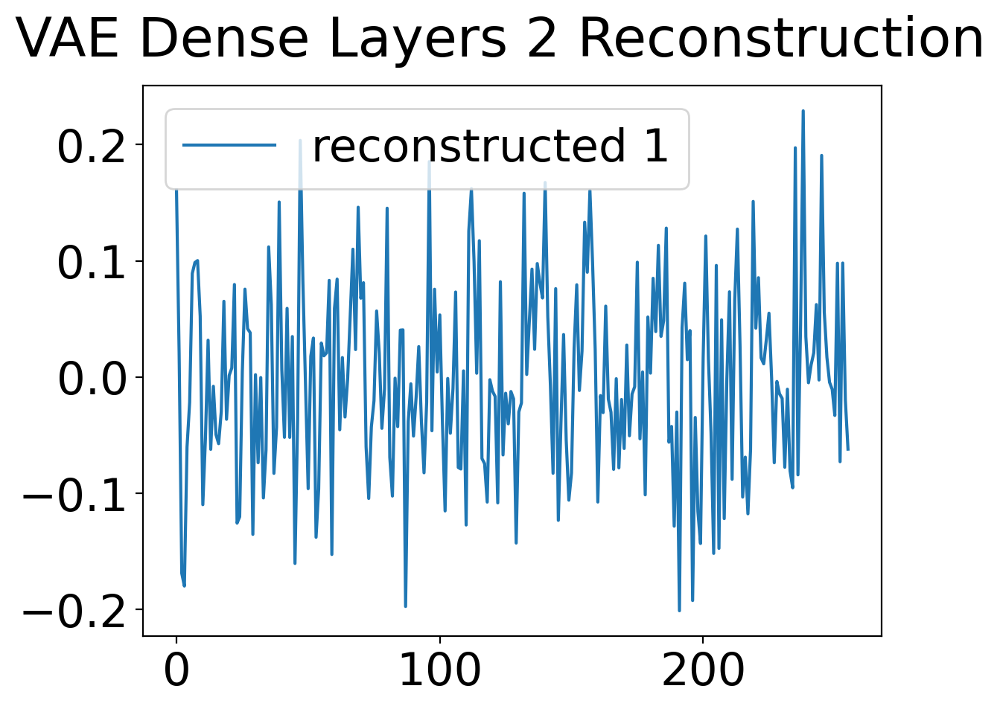

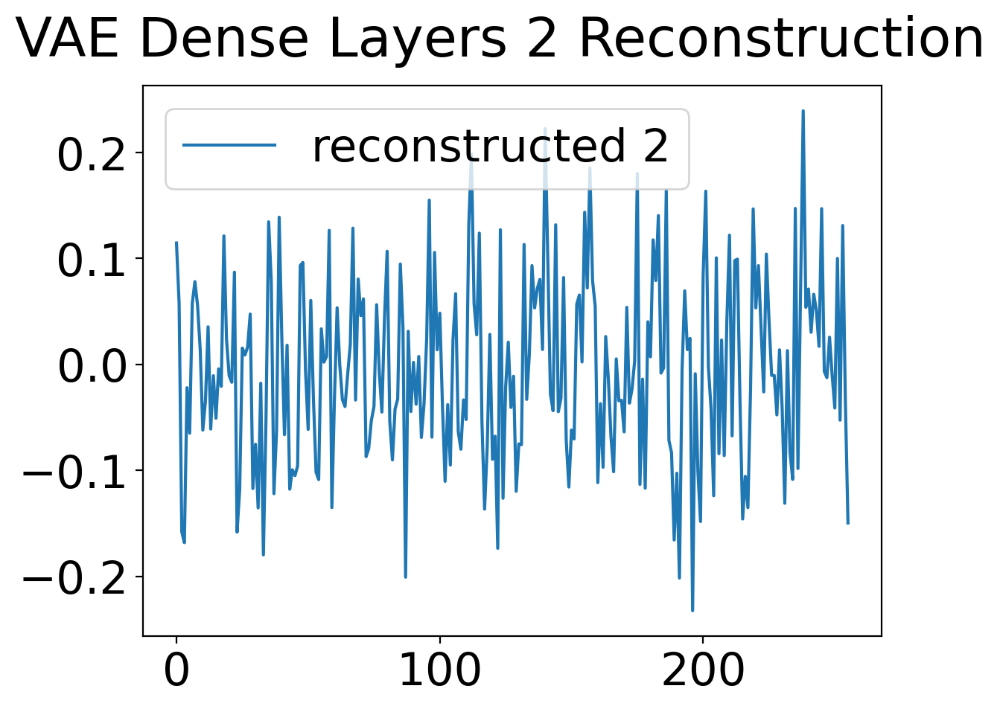

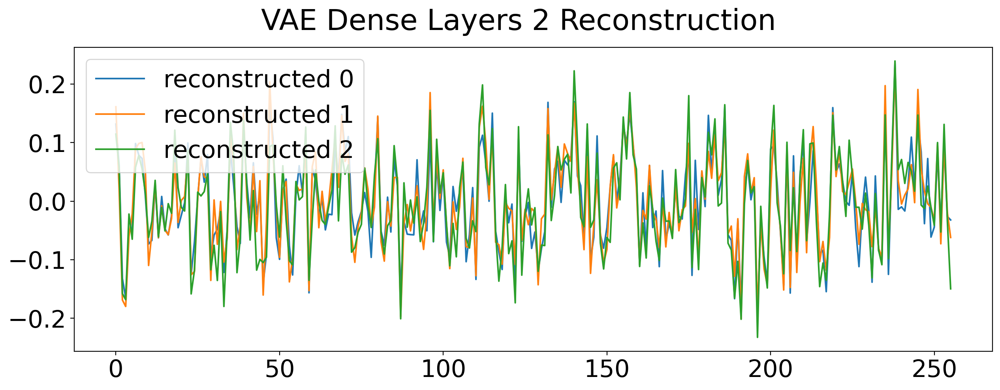

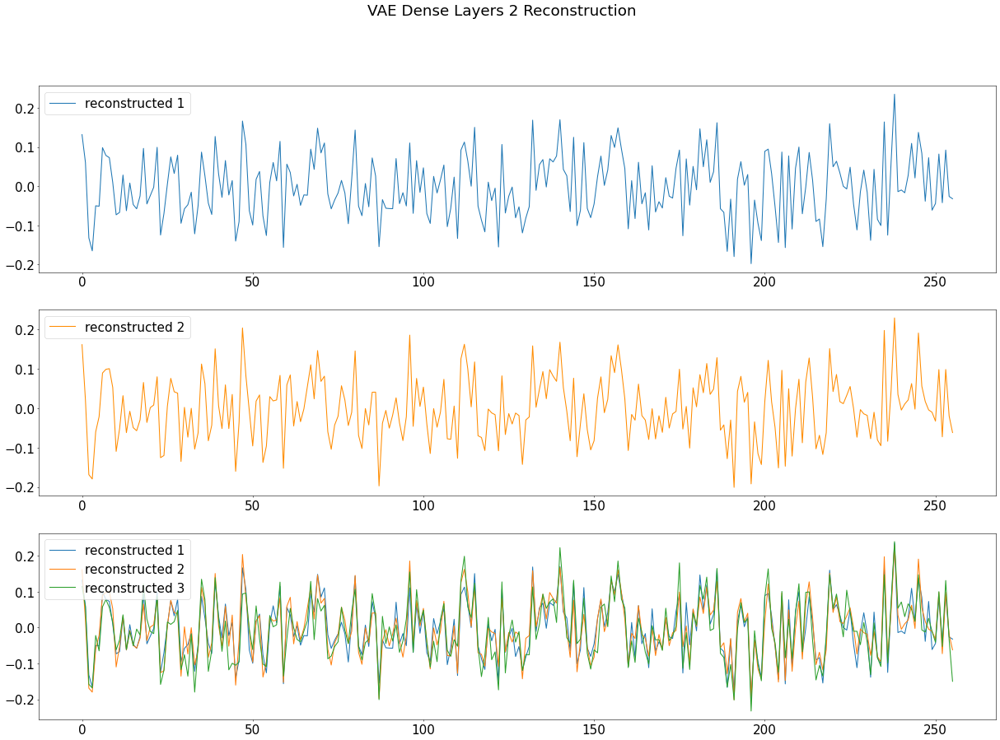

In [97]:
idxs = [20,50,110]
plot_series(x_hat, idxs, label = 'reconstructed ', title=model_name+' Reconstruction', save=False, merge=True)

In [98]:
latent_dims = 10
do_generation = False
if do_generation:
    generation = vae_generation(vae1.decoder, latent_dims=[stocks, latent_dims])
    np.save(gen_dir+'vaefd1.npy',generation)
else:
    generation = np.load(gen_dir+'vaefd1.npy')
print(generation.shape)

(434, 256)


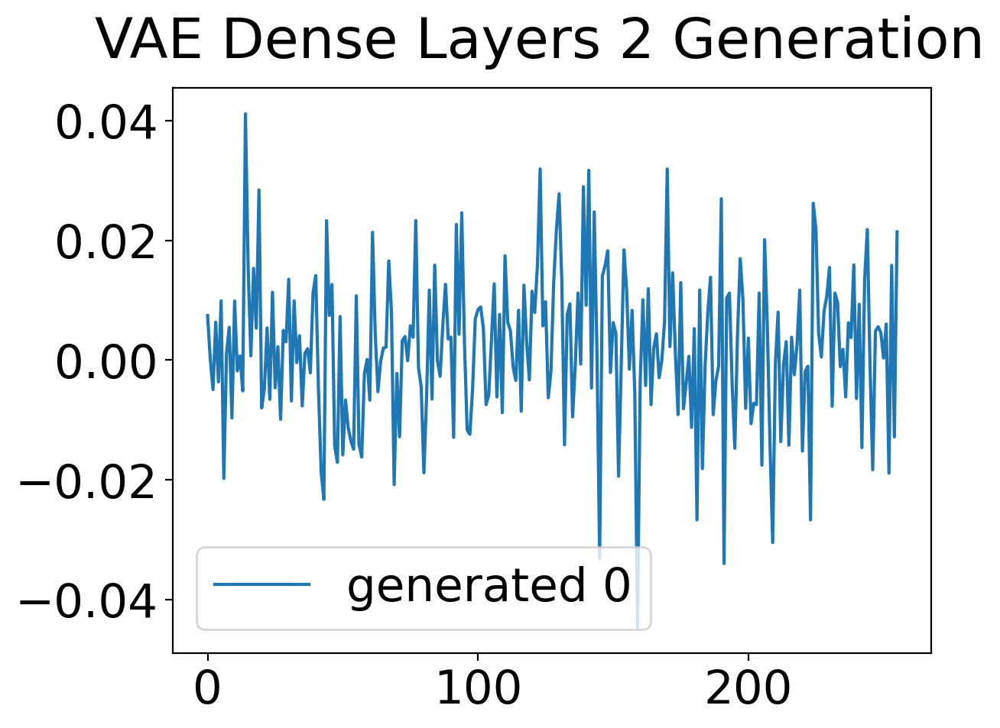

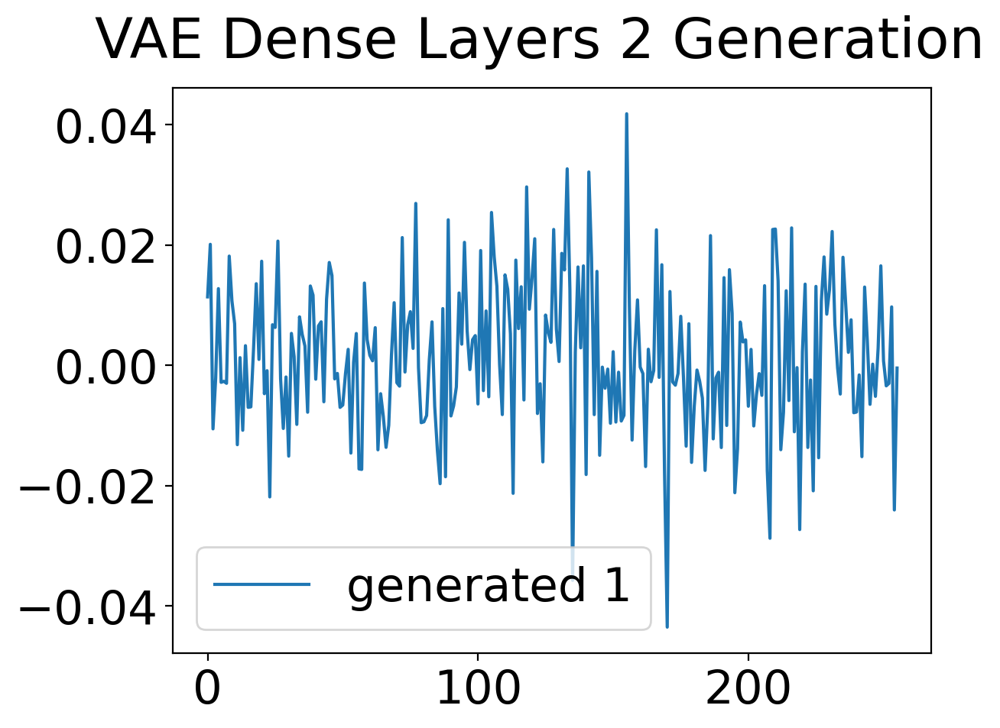

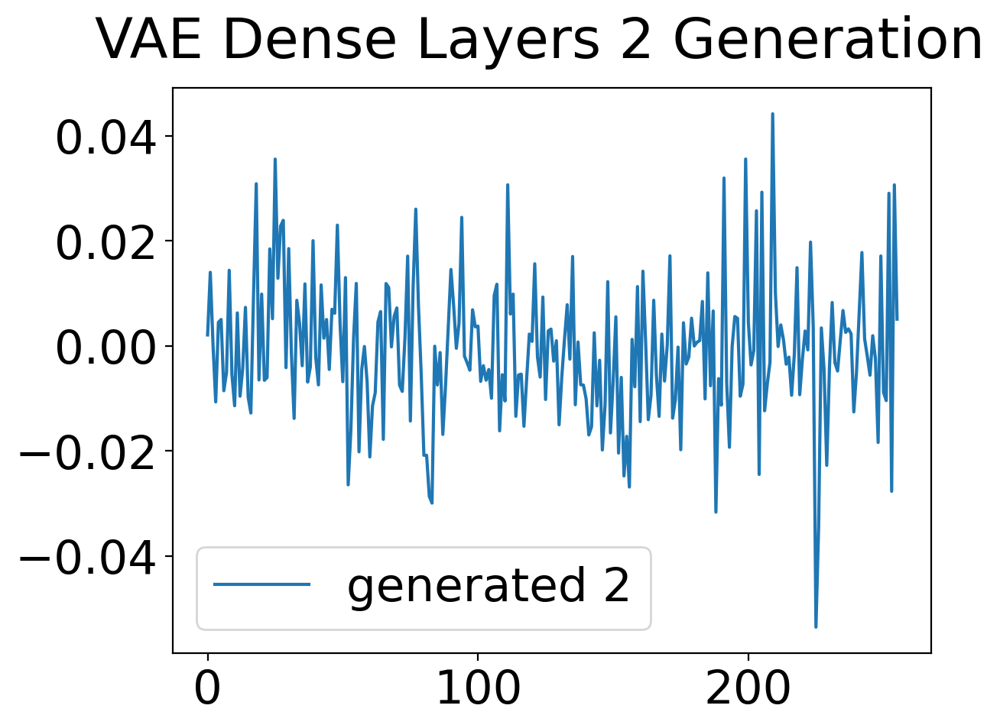

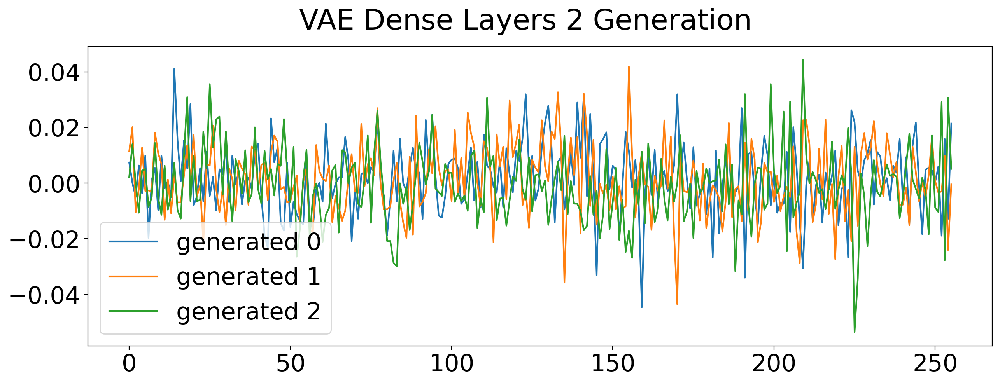

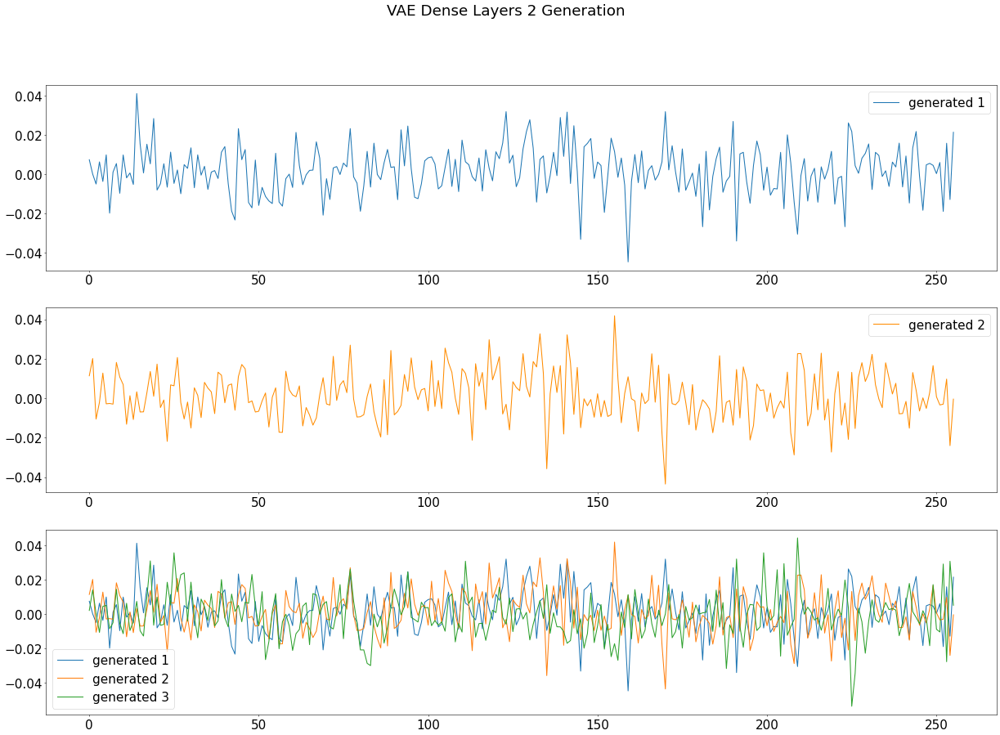

In [99]:
idx = [1, 2, 3]
plot_series(generation, idxs, label = 'generated ', title=model_name+' Generation', save=True, merge=True)

In [332]:
np.save(gen_dir+'vaefd2.npy',generation)
torch.save(vae1.state_dict(), models_dir +"vaefd2.pth") 

## VAE Fully Convolutional

    # Encoder 
    input
    torch.Size([434, 1, 256])
    conv1
    torch.Size([434, 16, 128])
    conv3
    torch.Size([434, 1, 64])
    flatten
    torch.Size([434, 64])

    # Latent space
    torch.Size([434, 32])
    

    # Decoder
    decoder input
    torch.Size([434, 64])
    unflatten
    torch.Size([434, 1, 64])
    deconv1
    torch.Size([434, 16, 128])
    deconv3
    torch.Size([434, 1, 256])
    deconv4
    torch.Size([434, 1, 256])
    flatten
    torch.Size([434, 256])
    linear
    torch.Size([434, 256])
 

In [107]:
class VAE_Conv(VAE_Base):
    def __init__(self,  h_dim=64, **kwargs):
        super(VAE_Conv, self).__init__( **kwargs)
        self.h_dim = h_dim
        self.encoder = nn.Sequential(
            # PrintLayer('input'),
            nn.Conv1d(1, 16, kernel_size=3, stride=2, padding=1).double(),
            # PrintLayer('conv1'),    
            nn.ReLU().double(),
            nn.Conv1d(16, 1, kernel_size=3, stride=2, padding=1).double(),
            # PrintLayer('conv3'),
            nn.ReLU().double(),
            nn.Flatten().double(),  # squezze 1 dimention (filter)
            # PrintLayer('flatten'),      
        )
        
        
        self.fc1 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc2 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc3 = nn.Linear(self.latent_dims, self.h_dim).double()
        
        self.decoder = nn.Sequential(
            # PrintLayer('decoder input'),
            UnFlatten(), # add 1 dimention (filter)
            # PrintLayer('unflatten'),
            nn.ConvTranspose1d(1, 16, kernel_size=3, stride=2, padding=1 ,output_padding=1).double(),
            # PrintLayer('deconv1'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(16, 1, kernel_size=3, stride=2, padding=1, output_padding=1).double(),
            # PrintLayer('deconv3'),
            nn.ReLU().double(),
            # PrintLayer('deconv4'),
        )

        self.last_layer = nn.Sequential(
            nn.Flatten().double(),
            # PrintLayer('flatten'),
            nn.Linear(256, 256).double(),
            # PrintLayer('linear'),
            UnFlatten3(),
            # PrintLayer('unflatten'),
        )
        
    def decode(self, z):
        # print('decoder input', z.shape)
        z = self.fc3(z)
        # print('decoder input', z.shape)
        z = self.decoder(z)
        z = self.last_layer(z)
        return z

class UnFlatten3(nn.Module):
    def forward(self, input, last_dim=256):
        return input.view(input.size(0), 1, last_dim)

In [108]:
latent_dims = 32
train = True
vae_conv = VAE_Conv(latent_dims=latent_dims).to(device)
model_name = 'VAE Fully Convolutional 1'

Epoch 1/60, Loss=2297.02184302149, Recon=1728.7089129978729, Reg=7411.838213234039 
Epoch 2/60, Loss=1661.7811483014204, Recon=1028.880964491366, Reg=7357.882802591908 
Epoch 3/60, Loss=1295.4617336633664, Recon=631.4549868448164, Reg=7271.522455030308 
Epoch 4/60, Loss=1074.913103113291, Recon=398.9380445138982, Reg=7158.688630507829 
Epoch 5/60, Loss=937.534043430479, Recon=261.3660011406259, Reg=7023.046424039153 
Epoch 6/60, Loss=848.4947004453048, Recon=179.5233741312608, Reg=6869.236637271699 
Epoch 7/60, Loss=787.8192127175806, Recon=130.59368711966124, Reg=6702.848943098852 
Epoch 8/60, Loss=743.8483288245263, Recon=100.98579435566404, Reg=6529.611139044282 
Epoch 9/60, Loss=710.4055484659516, Recon=83.26156851411005, Reg=6354.7013680325235 
Epoch 10/60, Loss=683.1372438019818, Recon=72.0914082660342, Reg=6182.549763625508 
Epoch 11/60, Loss=660.2537975921141, Recon=65.07836502138456, Reg=6016.832690728678 
Epoch 12/60, Loss=640.4321715716181, Recon=60.43307168488961, Reg=5860.

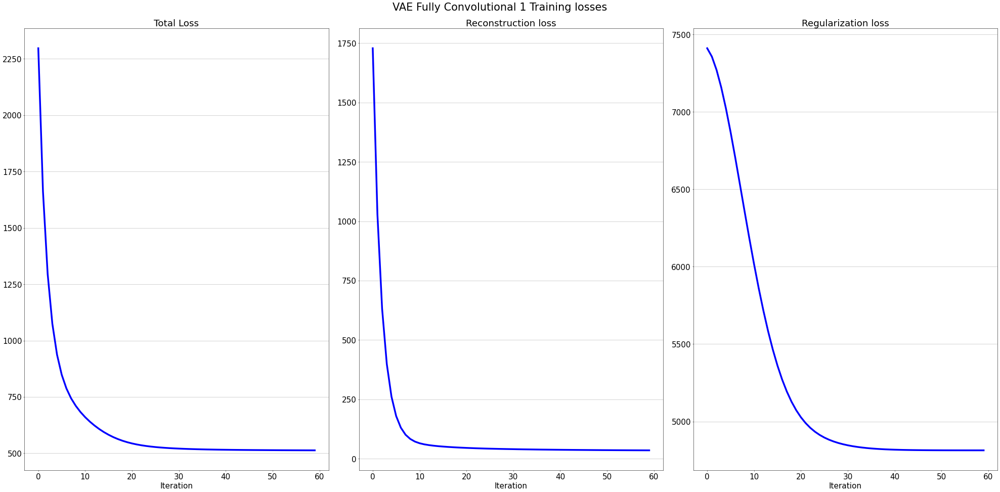

In [109]:
if train:
    vae_conv = train_vae(vae_conv, data.copy(), 60,extra_dim=True, learning_rate=0.00001, lambda_rec=0.9, lambda_reg=0.10, name=model_name)
    # torch.save(vae_conv.state_dict(), models_dir+'vaeconv1.pth')
else:
    vae_conv.load_state_dict(torch.load(models_dir+'vaeconv1.pth'))
    vae_conv.eval()
    print('Model loaded')

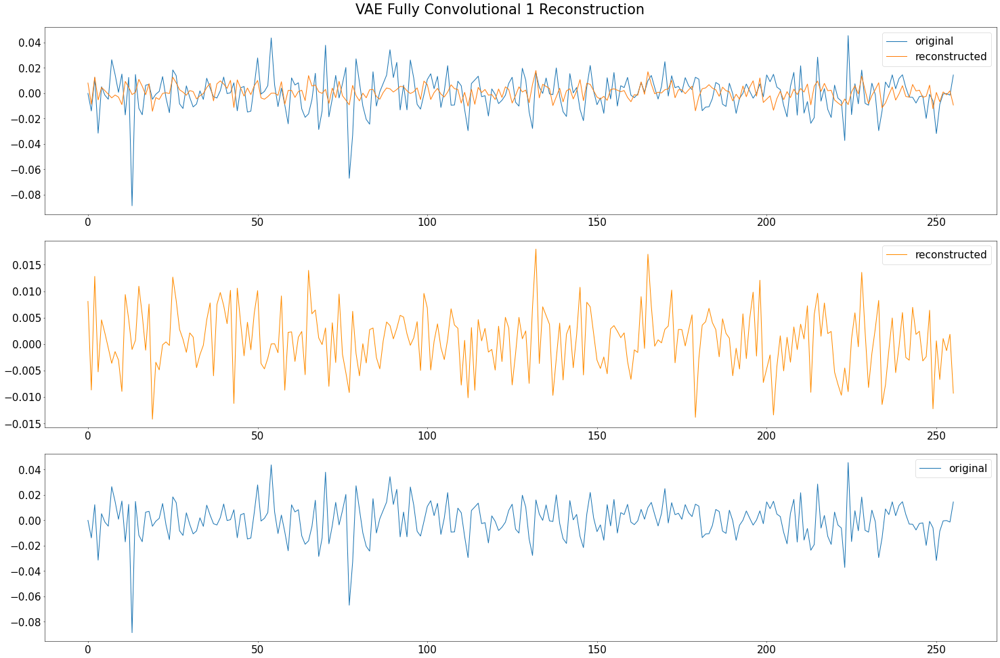

In [110]:
batch_idx = 0
series_idx = 2
_=plot_reconstruction(batch_idx, series_idx, vae_conv, data, extra_dim=True, name=model_name)

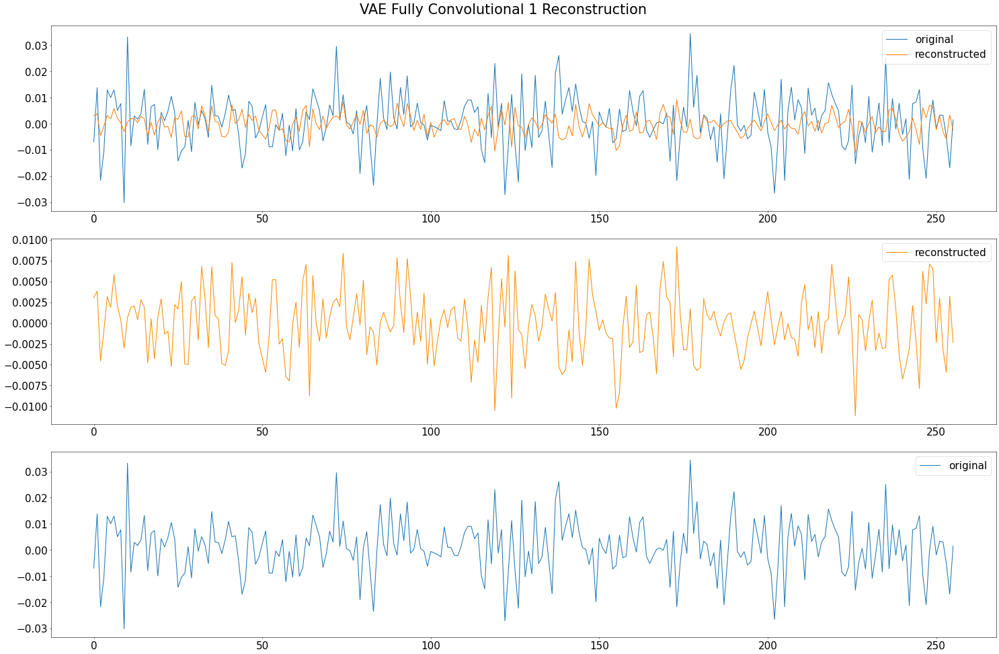

In [111]:
batch_idx = 40
series_idx = 2
x_hat = plot_reconstruction(batch_idx, series_idx, vae_conv, data, extra_dim=True, name=model_name)

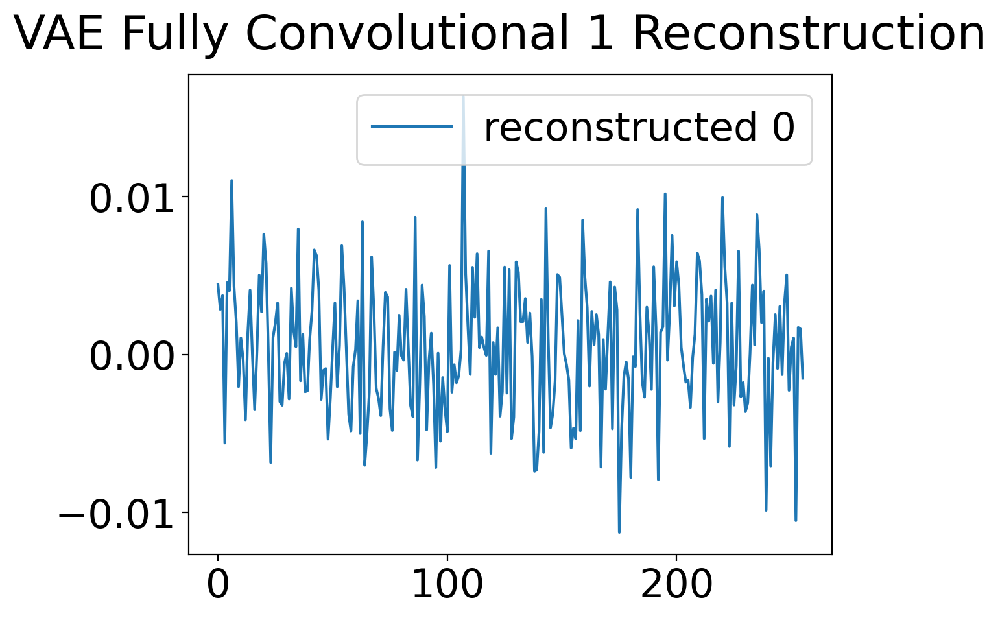

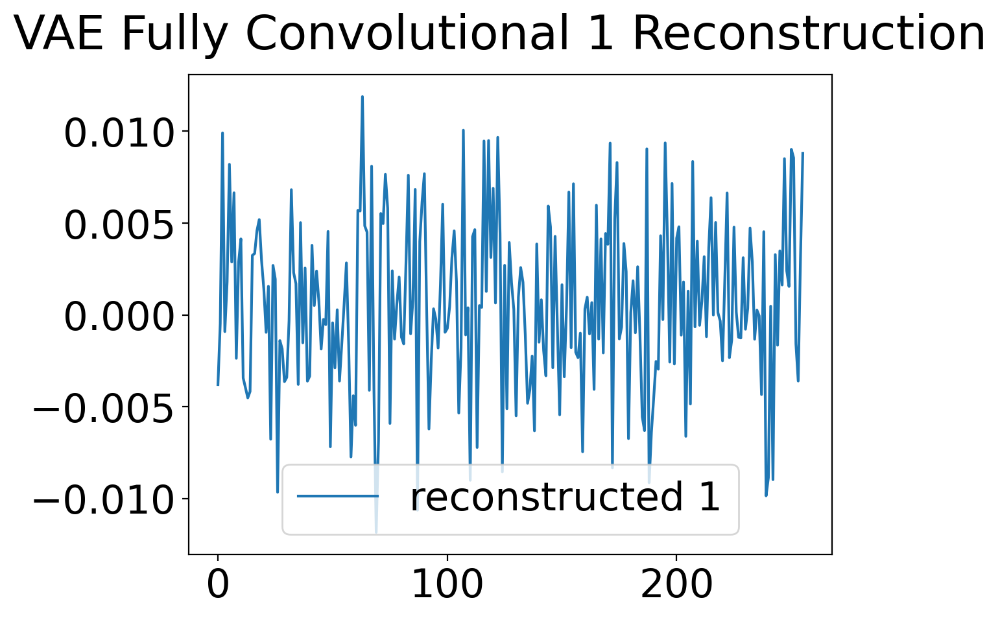

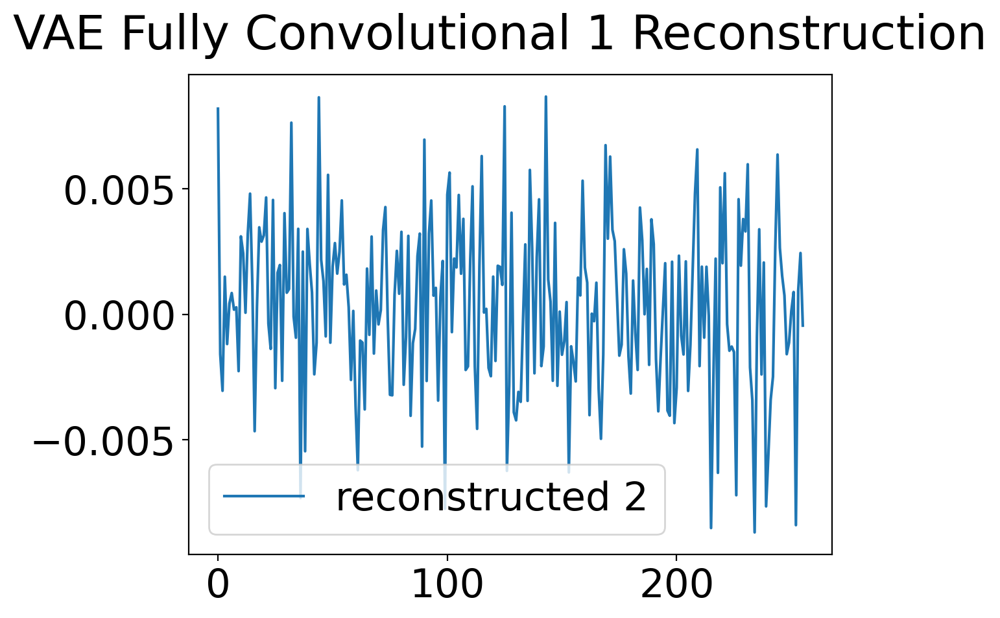

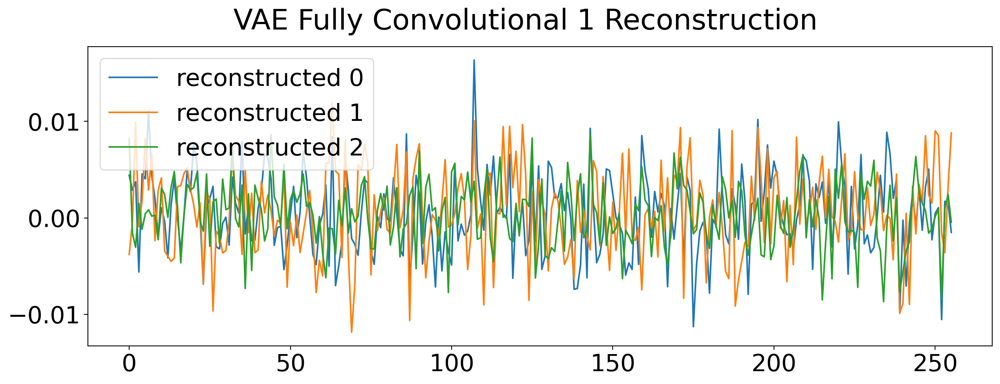

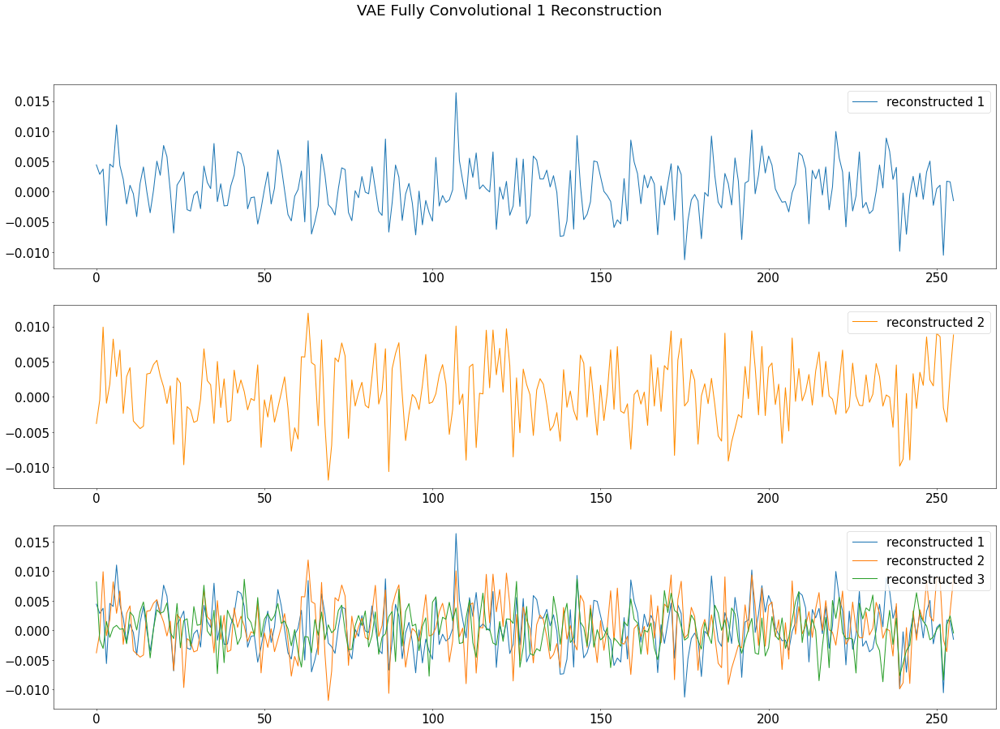

In [112]:
idxs = [20,50,110]
plot_series(x_hat, idxs, label = 'reconstructed ', title= model_name+' Reconstruction', save=False ,merge=True)

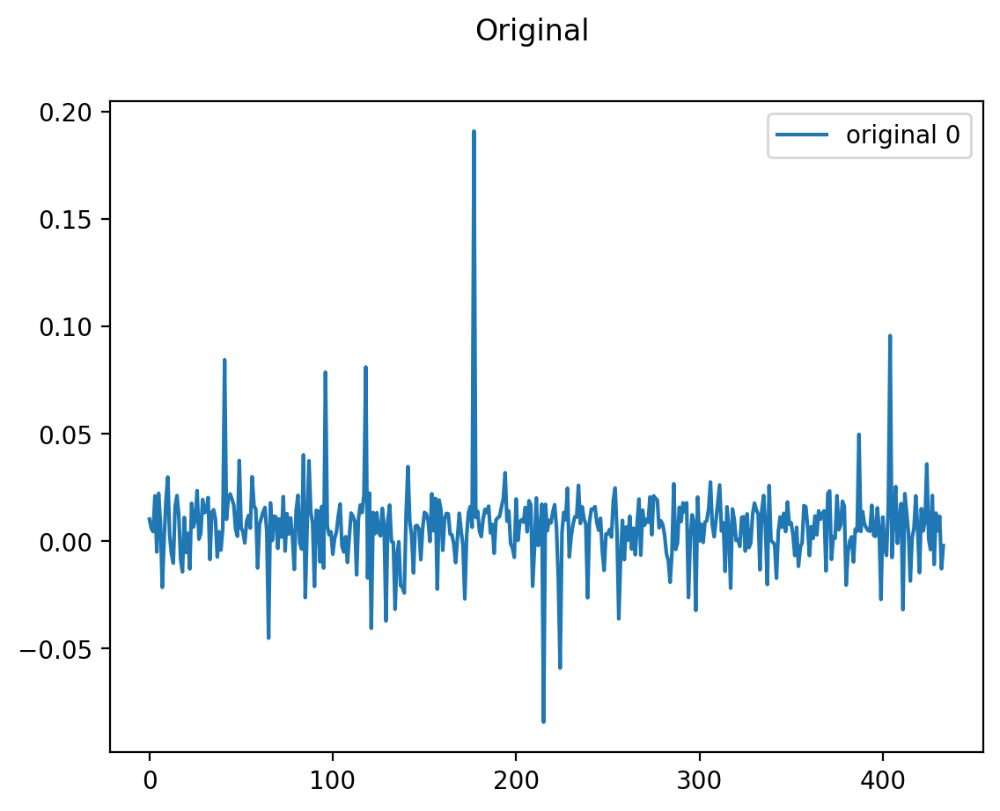

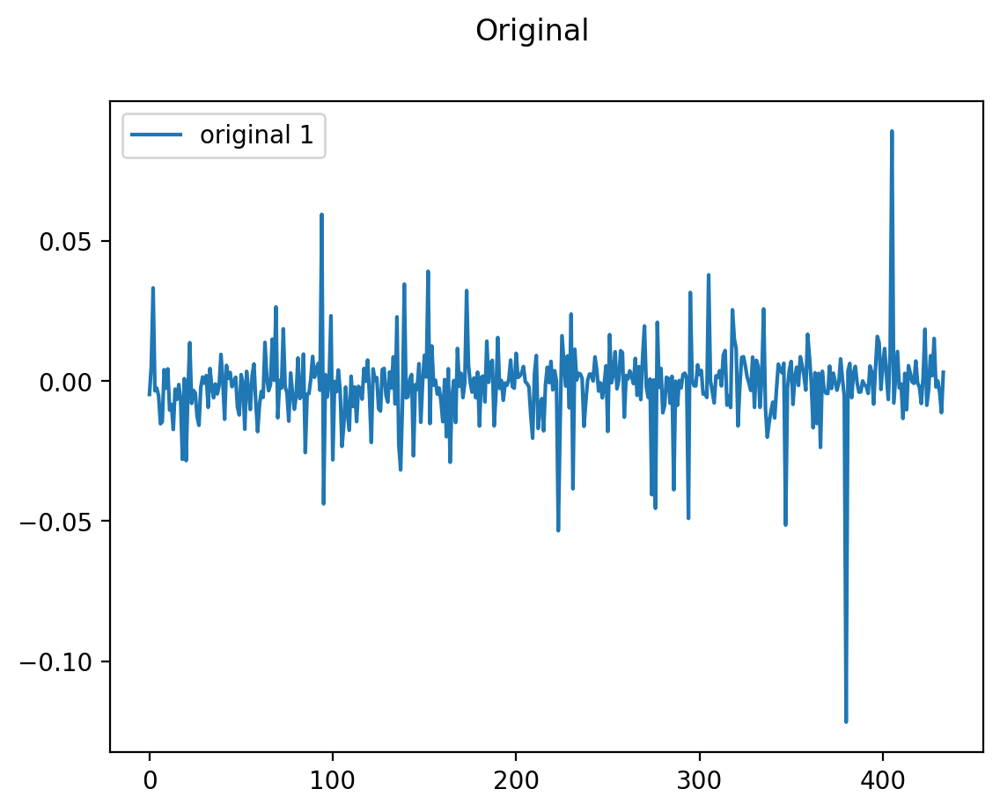

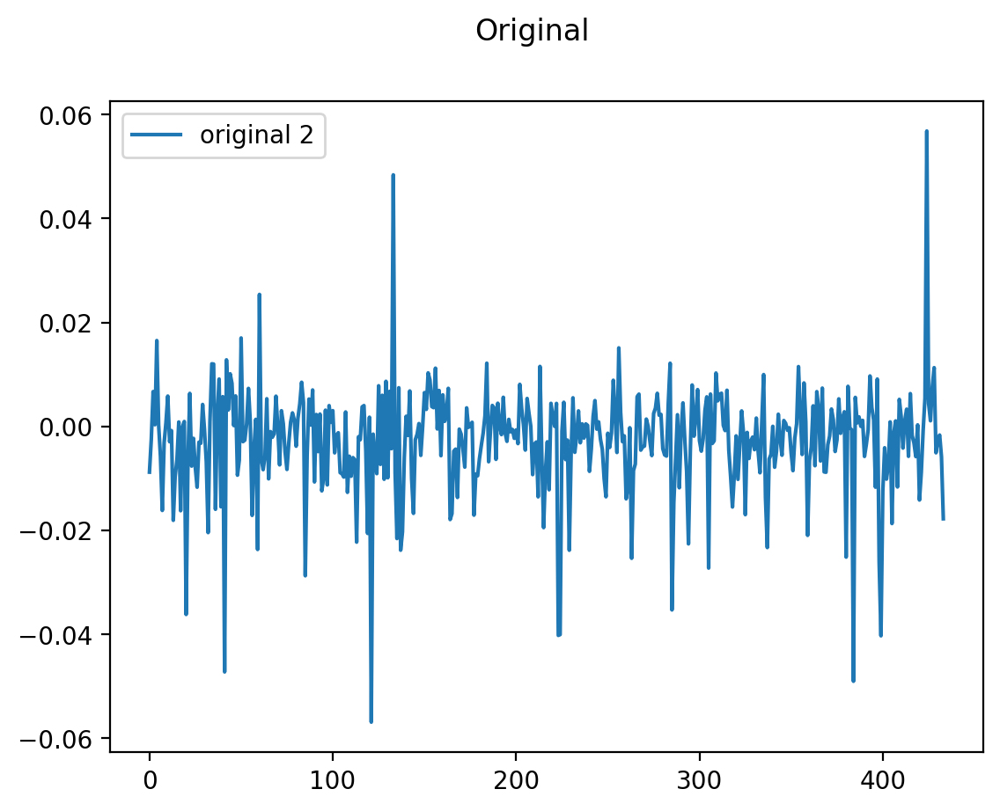

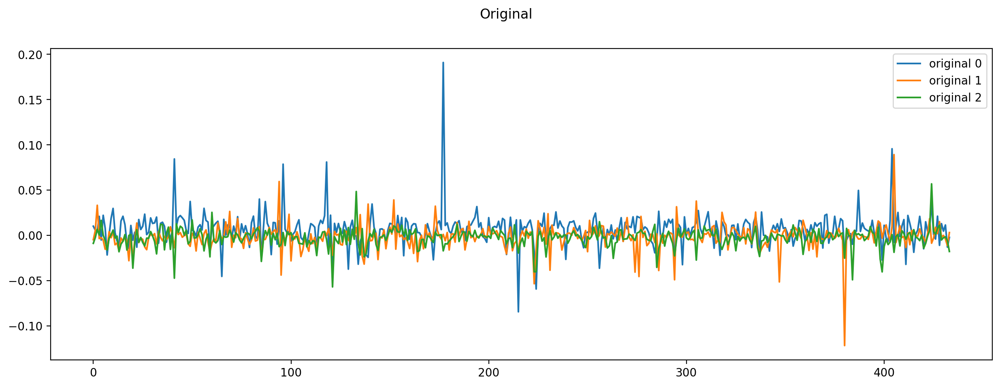

In [354]:
idxs = [20,10,110]
plot_series(data[batch_idx], idxs, label = 'original ', title='Original', figsize=(15, 5), merge=True)

In [113]:
latent_dims = 32
do_generation = False
if do_generation:
    generation = vae_generation(vae_conv.decode, latent_dims= [stocks, latent_dims], extra_dim=True)
    np.save(gen_dir+'vaeconv1.npy',generation)
else:
    generation = np.load(gen_dir+'vaeconv1.npy')
print(generation.shape)


(434, 256)


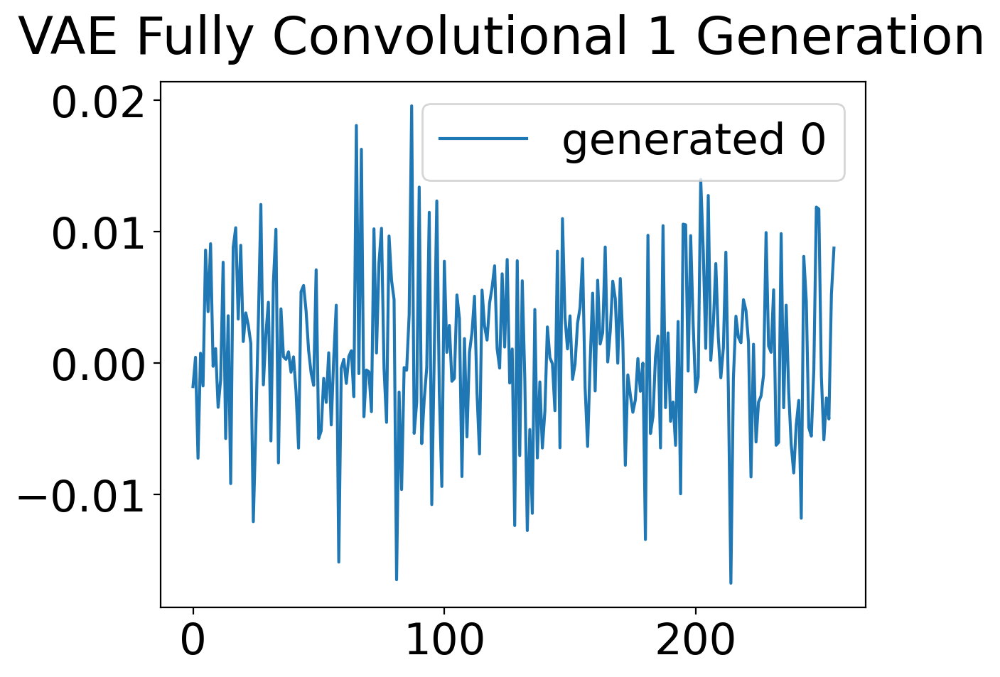

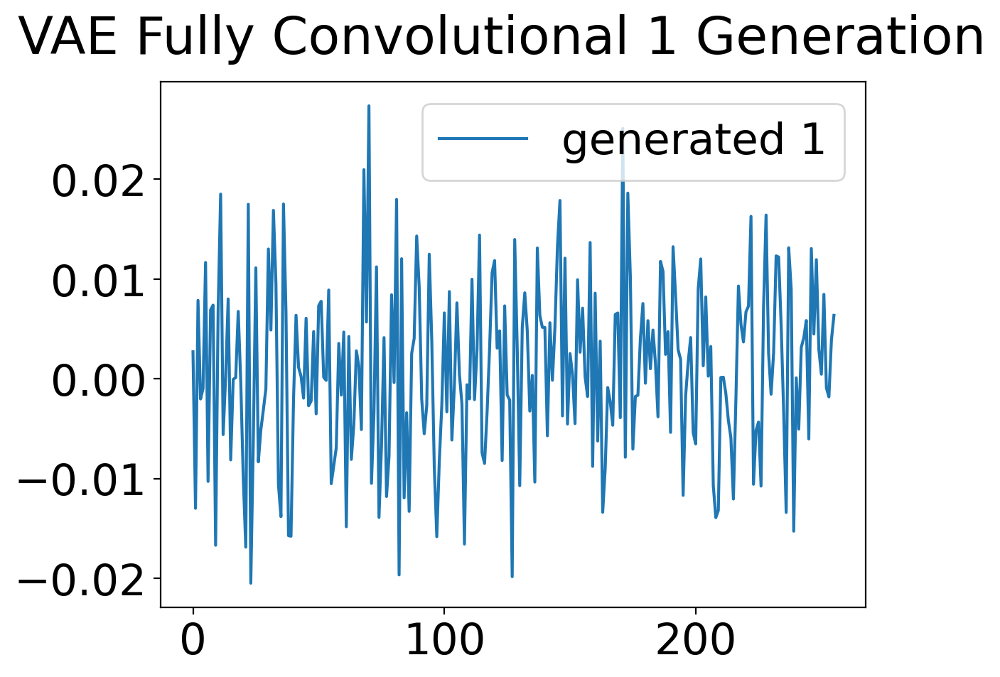

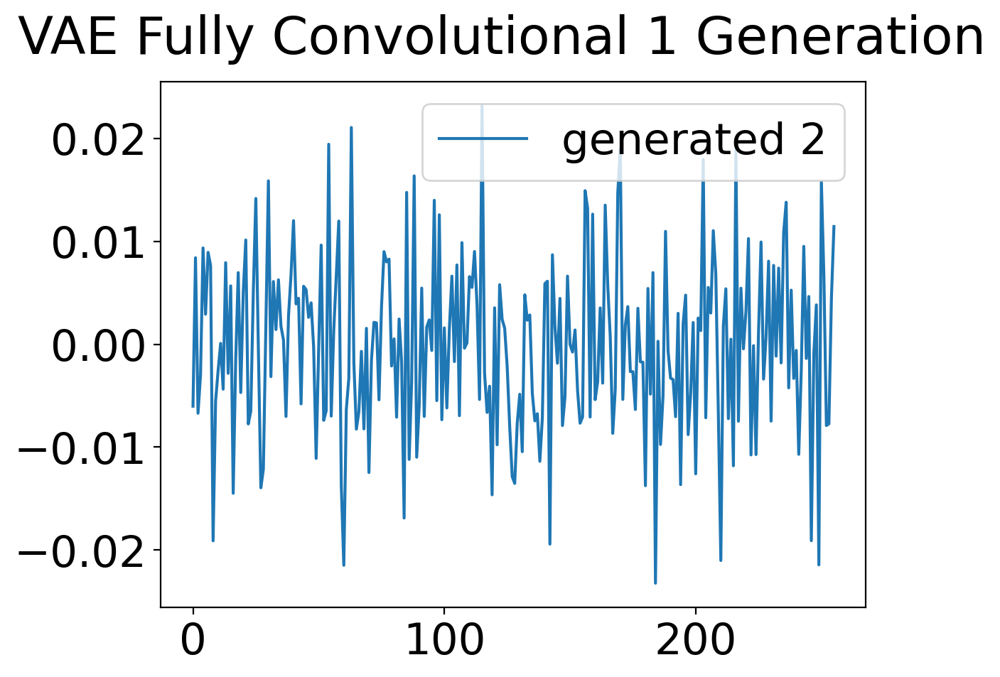

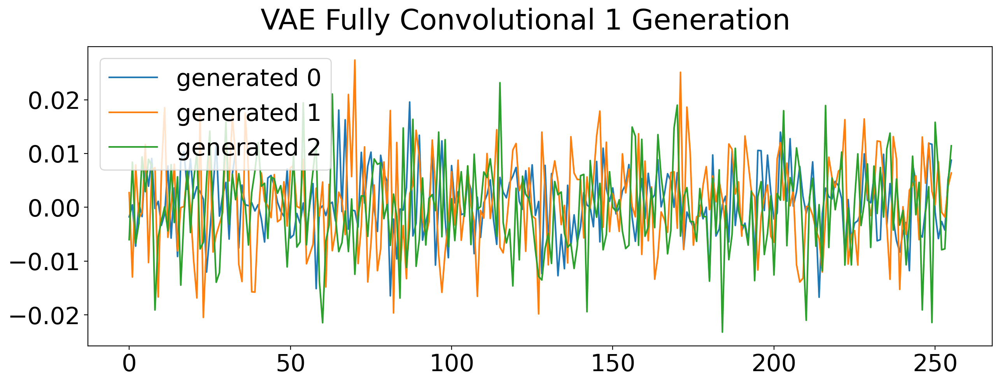

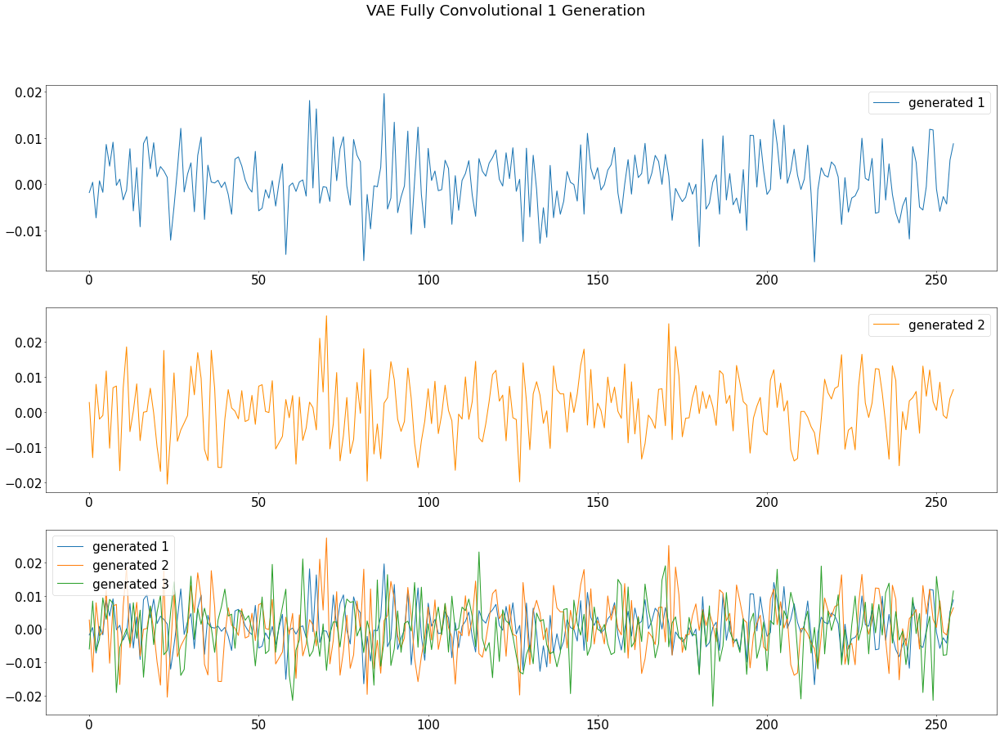

In [114]:
idx = [1, 2, 3]
plot_series(generation, idxs, label = 'generated ', title=model_name+' Generation', save=True, merge=True)


In [356]:
np.save(gen_dir+'vaeconv1.npy', generation)
torch.save(vae_conv.state_dict(), models_dir +"vaeconv1.pth") 

## VAE Fully Convolutional paper

    # Enconder
    input
    torch.Size([434, 1, 256])
    conv1
    torch.Size([434, 1, 128])
    conv2
    torch.Size([434, 12, 64])
    conv3
    torch.Size([434, 24, 32])
    conv4
    torch.Size([434, 48, 16])
    conv5
    torch.Size([434, 96, 8])
    conv6
    torch.Size([434, 1, 4])
    
    # laten
    flatten
    torch.Size([434, 4])
    decoder input torch.Size([434, 100])
    decoder input torch.Size([434, 4])
    
    # Decoder
    decoder input
    torch.Size([434, 4])
    unflatten
    torch.Size([434, 1, 4])
    deconv1
    torch.Size([434, 96, 8])
    deconv2
    torch.Size([434, 48, 16])
    deconv3
    torch.Size([434, 24, 32])
    deconv4
    torch.Size([434, 12, 64])
    deconv5
    torch.Size([434, 1, 128])
    deconv6
    torch.Size([434, 1, 256])

In [115]:
class VAE_Conv2(VAE_Base):
    def __init__(self,  h_dim=64, **kwargs):
        super(VAE_Conv2, self).__init__( **kwargs)
        self.h_dim = h_dim
        self.encoder = nn.Sequential(
            # PrintLayer('input'),
            nn.Conv1d(1, 1, kernel_size=4, stride=2, padding=1).double(),
            # PrintLayer('conv1'),
            nn.ReLU().double(),
            nn.Conv1d(1, 12, kernel_size=4, stride=2, padding=1).double(),
            # PrintLayer('conv2'),
            nn.ReLU().double(),
            nn.Conv1d(12, 24, kernel_size=4, stride=2, padding=1).double(),
            # PrintLayer('conv3'),
            nn.ReLU().double(),
            nn.Conv1d(24, 48, kernel_size=4, stride=2, padding=1).double(),
            # PrintLayer('conv4'),
            nn.ReLU().double(),
            nn.Conv1d(48, 96, kernel_size=4, stride=2, padding=1).double(),
            # PrintLayer('conv5'),
            nn.ReLU().double(),
            nn.Conv1d(96, 1, kernel_size=3, stride=2, padding=1).double(),
            # PrintLayer('conv6'),
            nn.Flatten().double(),
            # PrintLayer('flatten'),
        )

        self.fc1 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc2 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc3 = nn.Linear(self.latent_dims, self.h_dim).double()

        self.decoder = nn.Sequential(

            # PrintLayer('decoder input'),
            UnFlatten(),
            # PrintLayer('unflatten'),
            nn.ConvTranspose1d(1, 96, kernel_size=4, stride=2, padding=1 ,output_padding=0).double(),
            # PrintLayer('deconv1'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(96, 48, kernel_size=4, stride=2, padding=1, output_padding=0).double(),
            # PrintLayer('deconv2'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(48, 24, kernel_size=4, stride=2, padding=1, output_padding=0).double(),
            # PrintLayer('deconv3'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(24, 12, kernel_size=4, stride=2, padding=1, output_padding=0).double(),
            # PrintLayer('deconv4'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(12, 1, kernel_size=4, stride=2, padding=1, output_padding=0).double(),
            # PrintLayer('deconv5'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(1, 1, kernel_size=4, stride=2, padding=1, output_padding=0).double(),
            # PrintLayer('deconv6'),
            nn.ReLU().double(),


        )
        self.last_layer = nn.Sequential(
            nn.Flatten().double(),
            # PrintLayer('flatten'),
            nn.Linear(256, 256).double(),
            nn.Tanh().double(),
            # PrintLayer('linear'),
            UnFlatten3(),
            # PrintLayer('unflatten'),
        )

    def decode(self, z):
        # print('decoder input', z.shape)
        z = self.fc3(z)
        # print('decoder input', z.shape)
        z = self.decoder(z)
        # z = self.last_layer(z)
        return z
    
class UnFlatten2(nn.Module):
    def forward(self, input, last_dim=96):
        return input.view(input.size(0), last_dim, 8)
class UnFlatten3(nn.Module):
    def forward(self, input, last_dim=256):
        return input.view(input.size(0), 1, last_dim)

In [116]:
latent_dims = 100
train = True
vae_conv2 = VAE_Conv2(latent_dims=latent_dims, h_dim=4).to(device)
model_name = 'VAE Fully Convolutional Bad Model'

Epoch 1/20, Loss=15140.011576498688, Recon=33.31193302488088, Reg=30246.711219972487 
Epoch 2/20, Loss=13239.975455804364, Recon=33.31193302488088, Reg=26446.638978583855 
Epoch 3/20, Loss=11460.830640982222, Recon=33.31193302488088, Reg=22888.349348939548 
Epoch 4/20, Loss=10045.64568890143, Recon=33.31193302488088, Reg=20057.979444777975 
Epoch 5/20, Loss=9056.822940535762, Recon=33.31193302488088, Reg=18080.33394804664 
Epoch 6/20, Loss=8421.109287362255, Recon=33.31193302488088, Reg=16808.906641699625 
Epoch 7/20, Loss=8034.946925026768, Recon=33.31193302488088, Reg=16036.581917028656 
Epoch 8/20, Loss=7811.853273534726, Recon=33.31193302488088, Reg=15590.394614044573 
Epoch 9/20, Loss=7687.52160631138, Recon=33.31193302488088, Reg=15341.73127959788 
Epoch 10/20, Loss=7618.940734544259, Recon=33.31193302488088, Reg=15204.569536063635 
Epoch 11/20, Loss=7581.085525224441, Recon=33.31193302488088, Reg=15128.859117424001 
Epoch 12/20, Loss=7560.334777907765, Recon=33.31193302488088, R

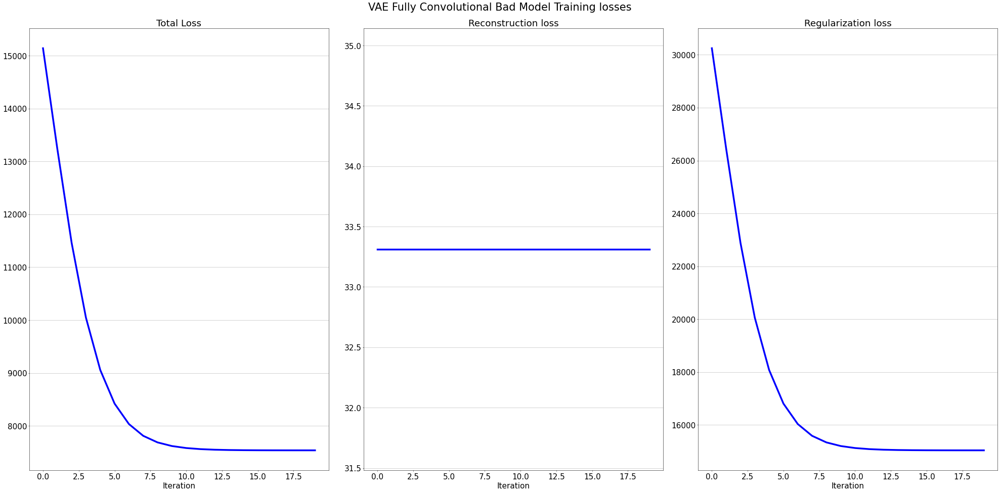

In [117]:
vae_conv2 = train_vae(vae_conv2, data, 20,extra_dim=True, learning_rate=0.0004, lambda_rec=0.5, lambda_reg=0.5,  name=model_name)

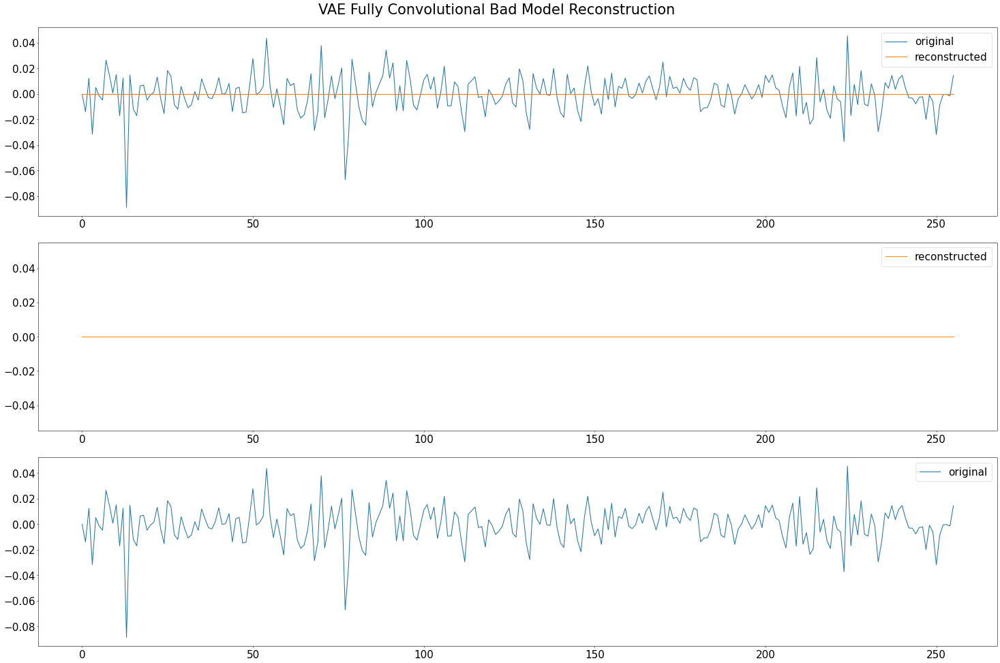

In [118]:
batch_idx = 0
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae_conv2, data.copy(), extra_dim=True, name=model_name)

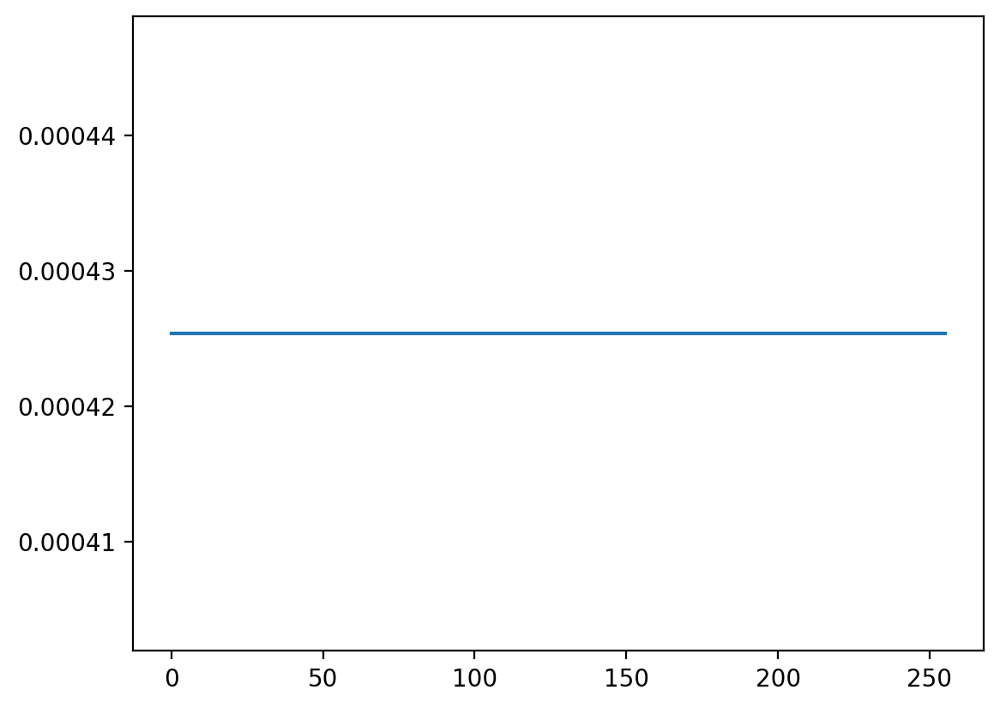

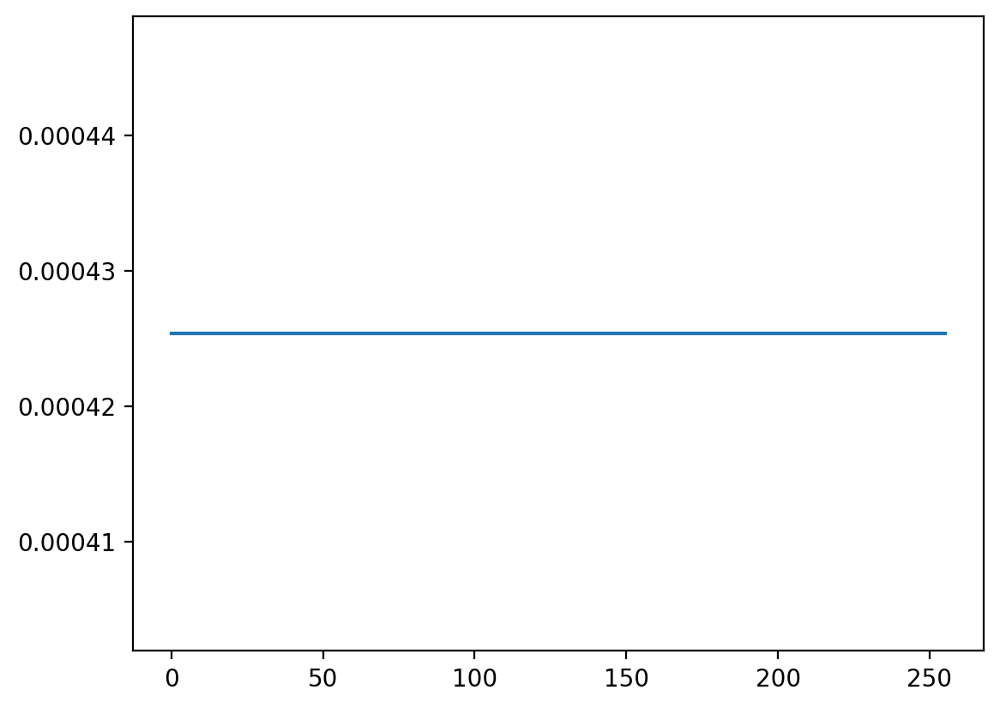

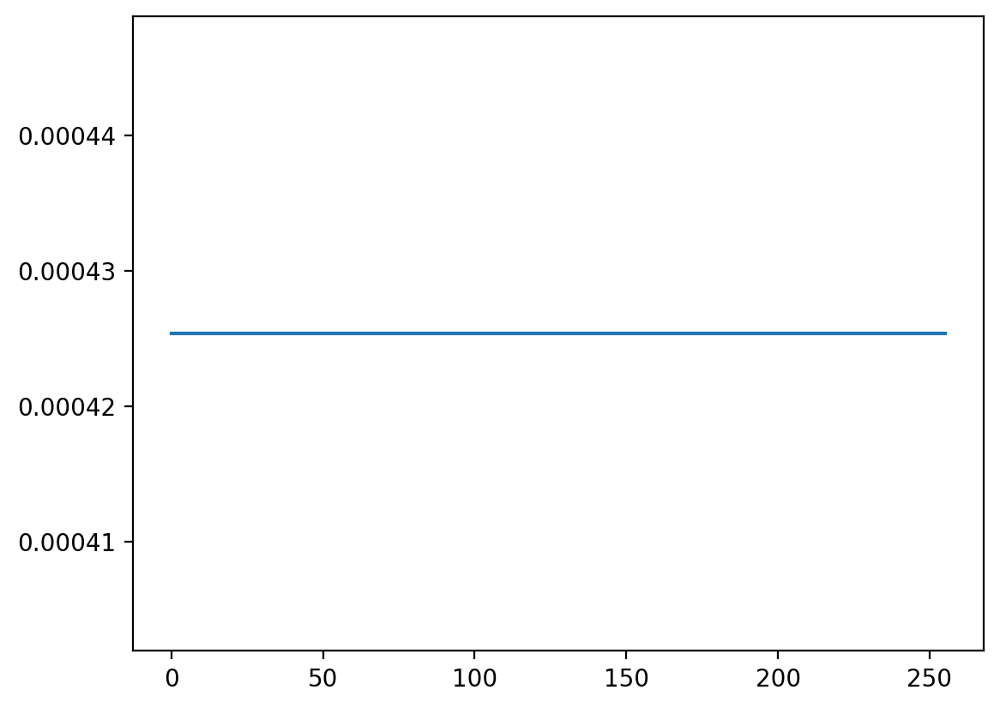

In [228]:
_ = synthesize(vae_conv2.decode,
               n_samples =1, latent_dims= [stocks, 100], extra_dim=True)

# VAE Fully Convolutional 2

    input
    torch.Size([434, 1, 256])
    conv1
    torch.Size([434, 32, 128])
    conv2
    torch.Size([434, 64, 64])
    flatten
    torch.Size([434, 4096])
    decoder input
    torch.Size([434, 4096])
    unflatten
    torch.Size([434, 64, 64])
    deconv2
    torch.Size([434, 32, 128])
    deconv3
    torch.Size([434, 1, 256])
    flatten
    torch.Size([434, 256])
    linear
    torch.Size([434, 256])
    unflatten
    torch.Size([434, 1, 256])

In [122]:
class VAE_Conv3(VAE_Base):
    def __init__(self,  h_dim=64, **kwargs):
        super(VAE_Conv3, self).__init__( **kwargs)
        self.h_dim = h_dim
        self.encoder = nn.Sequential(
            # PrintLayer('input'),
            nn.Conv1d(1, 32, kernel_size=3, stride=2, padding=1).double(),
            # PrintLayer('conv1'),
            nn.ReLU().double(),
            nn.Conv1d(32, 64, kernel_size=3, stride=2, padding=1).double(),
            # PrintLayer('conv2'),
            nn.ReLU().double(),
            nn.Flatten().double(),
            # PrintLayer('flatten'),
        )

        self.fc1 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc2 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc3 = nn.Linear(self.latent_dims, self.h_dim).double()

        self.decoder = nn.Sequential(

            # PrintLayer('decoder input'),
            UnFlatten2(),
            # PrintLayer('unflatten'),
            # nn.ConvTranspose1d(, 64, kernel_size=64, stride=2, padding=0 ,output_padding=1).double(),
            # PrintLayer('deconv1'),
            # nn.ReLU().double(),
            nn.ConvTranspose1d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1).double(),
            # PrintLayer('deconv2'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(32,1, kernel_size=3, stride=2, padding=1, output_padding=1).double(),
            # PrintLayer('deconv3'),
            nn.ReLU().double(),
            
        )

        self.last_layer = nn.Sequential(
            nn.Flatten().double(),
            # PrintLayer('flatten'),
            nn.Linear(256, 256).double(),
            # PrintLayer('linear'),
            UnFlatten3(),
            # PrintLayer('unflatten'),
        )
        
    def decode(self, z):
        # print('decoder input', z.shape)
        z = self.fc3(z)
        # print('decoder input', z.shape)
        z = self.decoder(z)
        z = self.last_layer(z)
        return z
    
class UnFlatten2(nn.Module):
    def forward(self, input, last_dim=64):
        return input.view(input.size(0), last_dim, 64)

In [123]:
latent_dims = 100
train = True
vae_conv3 = VAE_Conv3(latent_dims=latent_dims, h_dim=4096).to(device)
model_name = 'VAE Fully Convolutional 2'

Epoch 1/20, Loss=5353.813297599059, Recon=908.9613467157529, Reg=15725.134516326772 
Epoch 2/20, Loss=4731.129680668639, Recon=302.2733663690404, Reg=15065.127747367693 
Epoch 3/20, Loss=4636.280601548249, Recon=174.2568790503863, Reg=15047.669287376591 
Epoch 4/20, Loss=4597.334085084111, Recon=120.32227594590395, Reg=15043.694973073267 
Epoch 5/20, Loss=4577.133500322263, Recon=91.9618683287437, Reg=15042.533974973809 
Epoch 6/20, Loss=4565.100827821744, Recon=74.94099034931008, Reg=15042.140448590751 
Epoch 7/20, Loss=4557.231391141982, Recon=63.76534543144402, Reg=15041.985497799911 
Epoch 8/20, Loss=4551.748765418847, Recon=55.969191680547276, Reg=15041.901104141545 
Epoch 9/20, Loss=4547.645389057887, Recon=50.126473311478925, Reg=15041.856192466179 
Epoch 10/20, Loss=4544.650730018721, Recon=45.8639587026999, Reg=15041.819863089437 
Epoch 11/20, Loss=4542.337662644461, Recon=42.566852389986146, Reg=15041.802886571564 
Epoch 12/20, Loss=4540.696867145143, Recon=40.23334713504182,

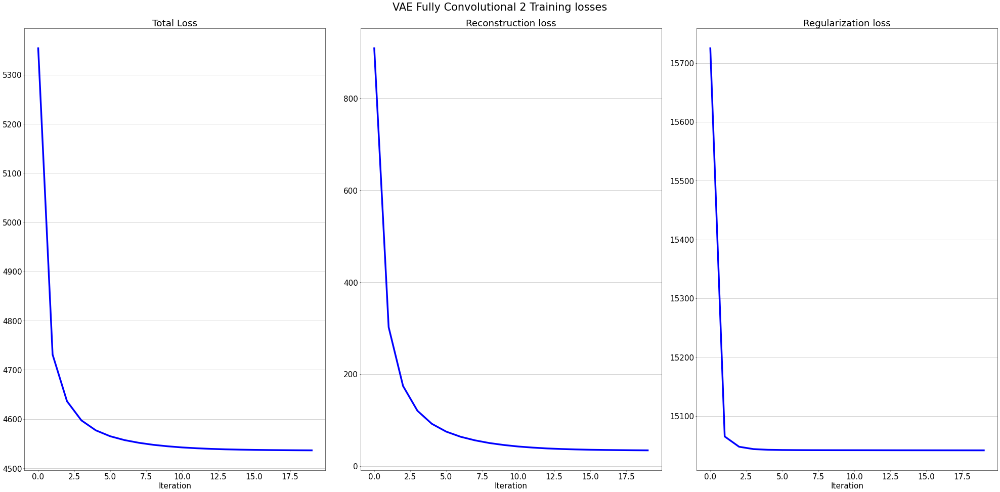

In [124]:
if train:
    vae_conv3 = train_vae(vae_conv3, data, 20,extra_dim=True, learning_rate=0.0001, lambda_rec=0.7, lambda_reg=0.3, name=model_name)
    # torch.save(vae_conv3.state_dict(), models_dir+'vaeconv3.pth')
else:
    vae_conv3.load_state_dict(torch.load(models_dir+'vaeconv3.pth'))
    vae_conv3.eval()
    print('Model loaded')

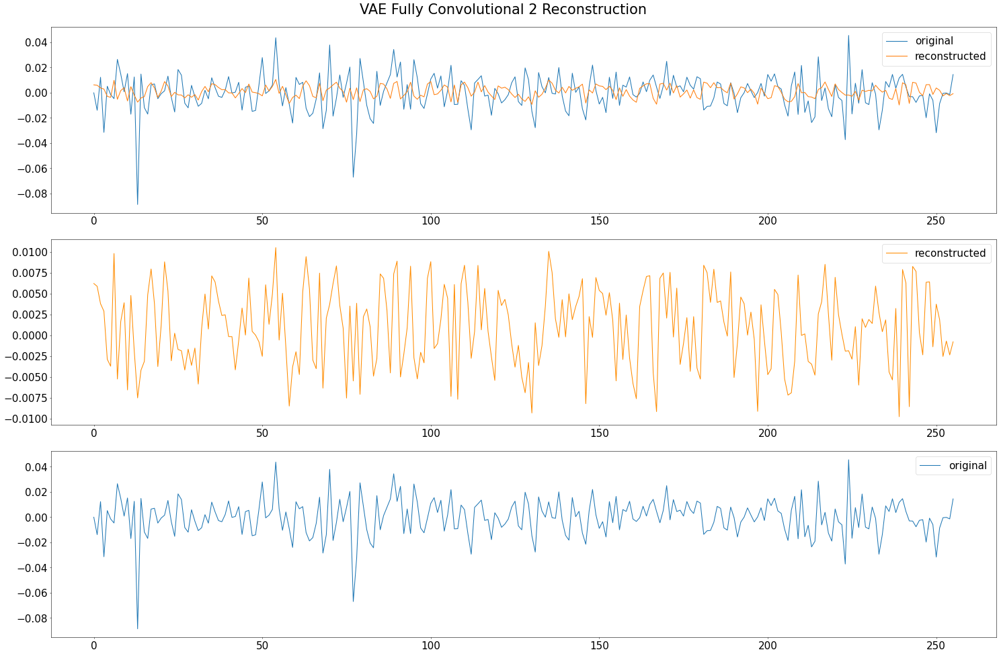

In [125]:
batch_idx = 0
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae_conv3, data.copy(), extra_dim=True, name=model_name)

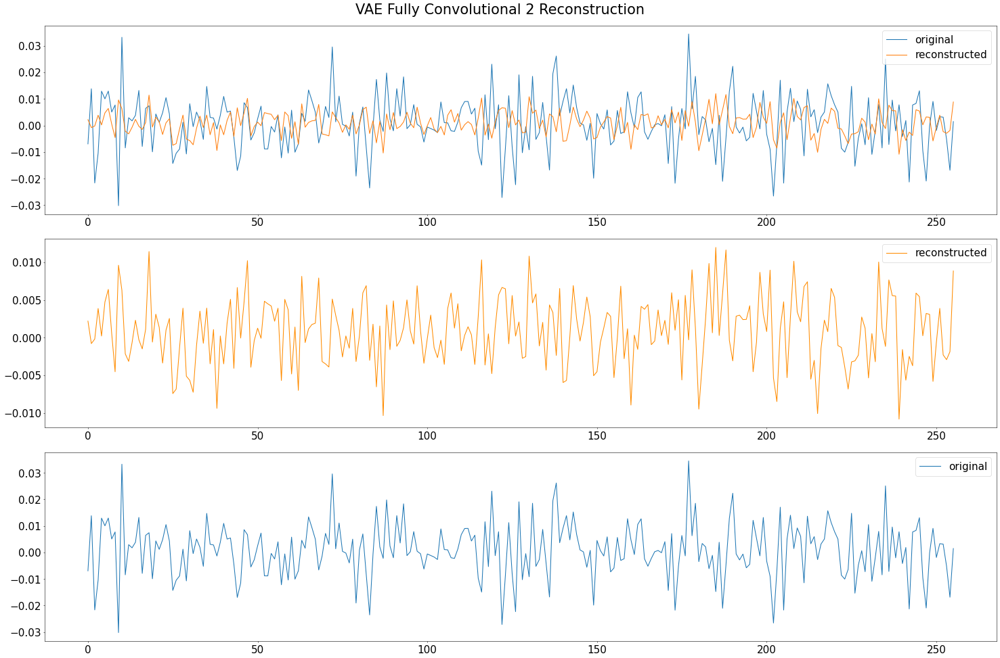

In [126]:
batch_idx = 40
series_idx = 2
x_hat = plot_reconstruction(batch_idx, series_idx, vae_conv, data.copy(), extra_dim=True, name=model_name)

In [127]:
do_generation = False
if do_generation:
    generation = vae_generation(vae_conv3.decode,latent_dims= [stocks, 100], extra_dim=True) 
    np.save(gen_dir+'vaeconv3.npy',generation)
else:
    generation = np.load(gen_dir+'vaeconv3.npy')
print(generation.shape)

(434, 256)


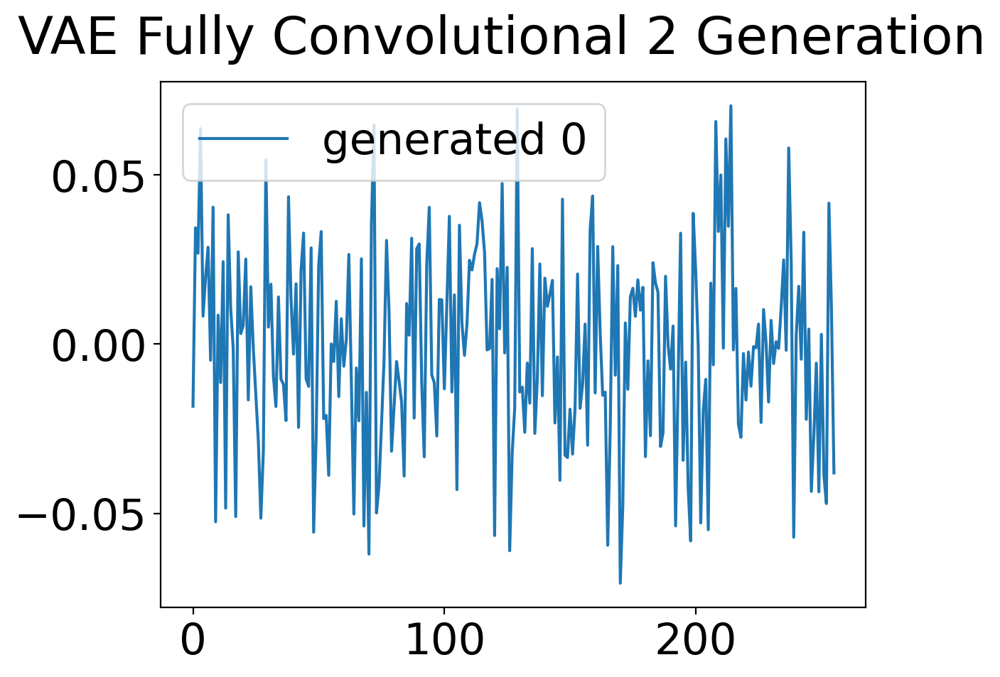

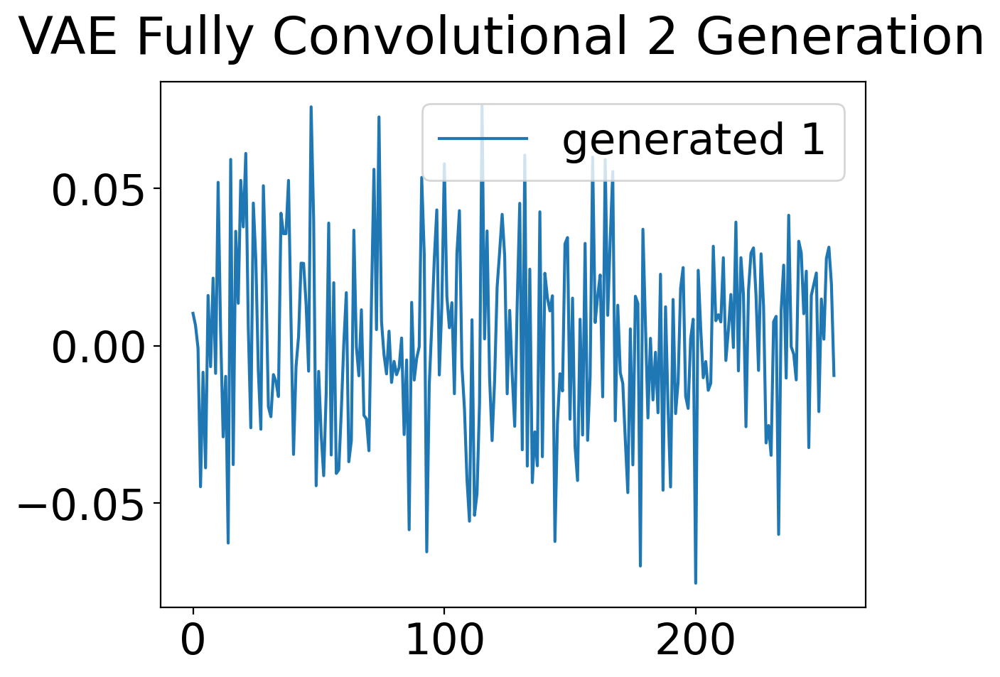

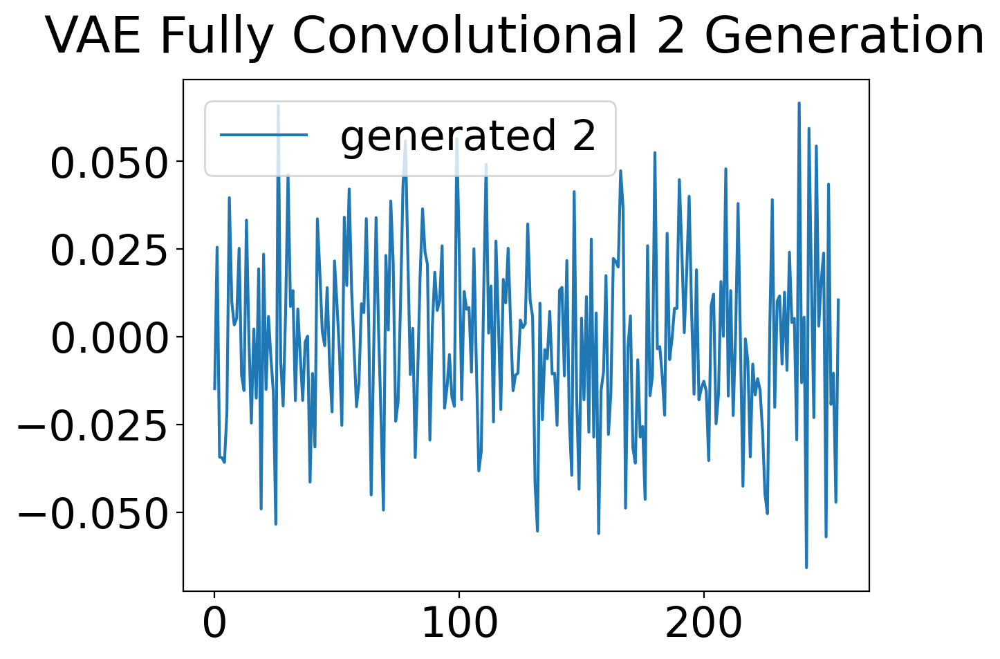

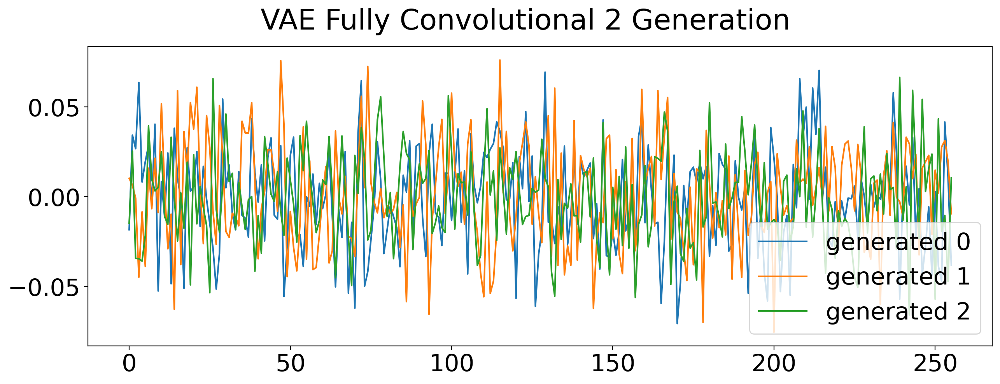

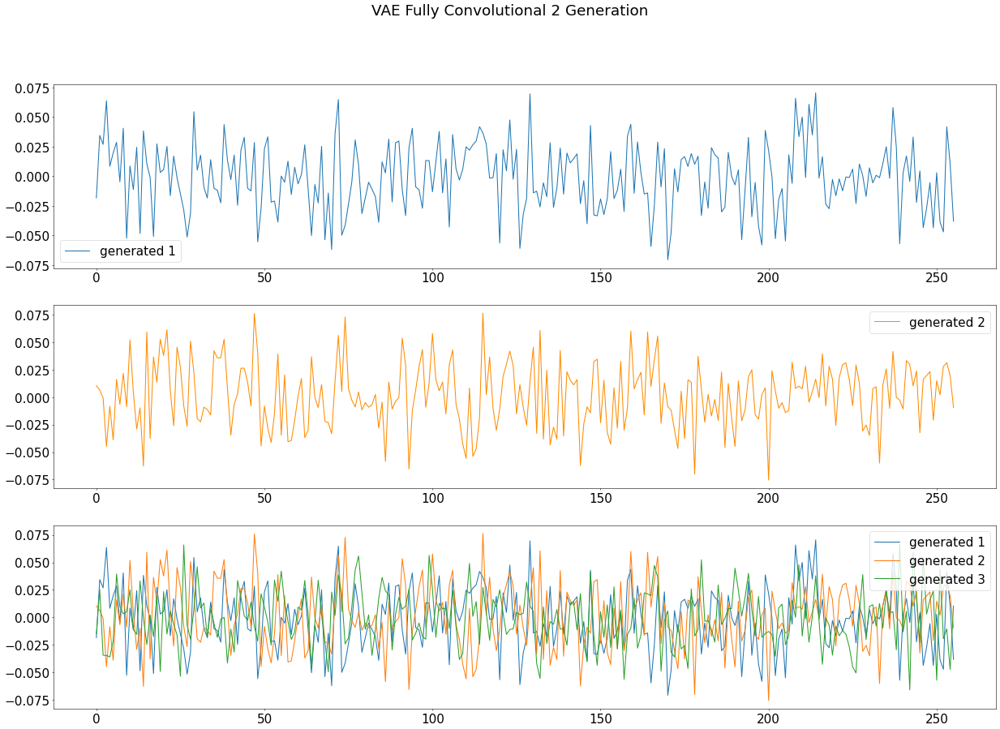

In [128]:
idx = [1, 2, 3]
plot_series(generation, idxs, label = 'generated ', title=model_name+' Generation', save=True, merge=True)

In [408]:
np.save(gen_dir+'vaeconv3.npy',generation)
torch.save(vae_conv3.state_dict(), models_dir +"vaeconv3.pth") 